<a href="https://colab.research.google.com/github/aviadazriel/big_data_bgu/blob/master/Final_Project_Analyze_the_effects_of_covid_19_on_Twitter_31_08.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Installs

In [23]:
!pip install pyLDAvis
!pip install emoji
!python3 -m spacy download en

✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
✔ Linking successful
/usr/local/lib/python3.6/dist-packages/en_core_web_sm -->
/usr/local/lib/python3.6/dist-packages/spacy/data/en
You can now load the model via spacy.load('en')


In [24]:
!pip install turicreate

#imports

In [25]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [26]:
import warnings
import pandas as pd
pd.set_option("display.max_colwidth", 200) 
warnings.filterwarnings("ignore", category=DeprecationWarning) 
%matplotlib inline

In [27]:
import os
import emoji
import spacy
from pylab import rcParams
from scipy.signal import savgol_filter
import _pickle as cPickle
from sklearn.decomposition import PCA
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import copy
import datetime
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from collections import Counter
import pandas as pd
from tqdm import tqdm
from wordcloud import WordCloud
from dateutil import parser
from nltk.stem import WordNetLemmatizer
from plotly.offline import iplot
import seaborn as sns
import re
import nltk
import string
from wordcloud import WordCloud
from PIL import Image
import codecs
import cv2
import numpy as np
from string import punctuation 
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
from collections import defaultdict
from sklearn.decomposition import LatentDirichletAllocation
import plotly.express as px
from textblob import TextBlob
import pyLDAvis
import turicreate as tc
import pyLDAvis.gensim
import matplotlib.pyplot as plt
%matplotlib inline
tqdm.pandas()
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [28]:
# pd.options.mode.chained_assignment = None 

# Functions

##### Utils

In [35]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

def save_pickle_object(obj, obj_name, url):
    file = open(url + obj_name + '.obj', 'wb')
    cPickle.dump(obj, file)
    print('Info: saved {o} pickle file.'.format(o=str(obj_name)))

def load_pickle_object(obj_name, url):
    file = open(url + obj_name + '.obj', 'rb')
    obj = cPickle.load(file)
    print('Info: uploading {o} pickle file.'.format(o=str(obj_name)))
    return obj

def parse_date(x):
  
  try:
    date = parser.parse(x)
  except:
    date = np.nan

  return date


def concat_dfs_by_row(list_of_dfs):
    new_list_Of_dfs = []

    if len(list_of_dfs) < 2:
        print('Error: less than two DFs.')
        return None

    for df in tqdm(list_of_dfs):
        df.reset_index(drop=True, inplace=True)
        new_list_Of_dfs.append(df)

    all_df = pd.concat(new_list_Of_dfs, axis=0, ignore_index=True)

    return all_df

def concat_dfs_by_col(list_of_dfs):
    new_list_Of_dfs = []

    if len(list_of_dfs) < 2:
        print('Error: less than two DFs.')
        return None

    row_shape = list_of_dfs[0].shape[0]
    for df in list_of_dfs:
        assert df.shape[0] == row_shape
        df.reset_index(drop=True, inplace=True)
        new_list_Of_dfs.append(df)

    all_df = pd.concat(new_list_Of_dfs, axis=1)

    return all_df

def plot_histogram(df, column, title):
    ax = sns.distplot(df[column])
    plt.suptitle(title)
    plt.show()


def get_sentiment(text):
   return  TextBlob(text).sentiment.polarity


def word_cloud(df , column, max_words=200,pic_path = None):
  all_words = df[column].dropna()
  words = " ".join(" ".join(list(all_words)).split())
  plt.subplots(figsize=(28,12))

  if pic_path is  not None:
    mask = cv2.imread(pic_path, 1)
    mask2 = np.array(Image.open(pic_path)) 
    wordcloud = WordCloud(background_color="white",#mode="RGBA",
                                max_words=max_words,mask=mask,max_font_size=256#,width=mask.shape[1],height=mask.shape[0]
                                ).generate(words)
  else:  
    wordcloud = WordCloud(background_color="white", mode="RGBA",
                              width=2048,
                              max_words=max_words,
                              height=1024,
                              collocations=False).generate(words)

  # show
  plt.imshow(wordcloud, interpolation="bilinear")
  plt.axis("off")
  plt.figure()
  if pic_path is  not None:
    plt.imshow(mask2, cmap=plt.cm.gray, interpolation='bilinear')
    plt.axis("off")
    plt.show()

def get_topics_per_doc(ldamodel, corpus):
  
  topics_df = pd.DataFrame()
  l = [ldamodel.get_document_topics(daily_tokens, minimum_probability=0) for daily_tokens in corpus]
  cols = []
  for row in tqdm(l):
    dist = []
    col = []
    for j, (topic_num, prop_topic) in enumerate(row):
      col.append('Topic '+str(topic_num))
      dist.append(prop_topic)
    
    cols.append(col)
    topics_df = topics_df.append(pd.Series(dist),ignore_index=True)
  
  assert len(set(list(map(' '.join, cols))))==1
  topics_df.columns = cols[0]
  topics_df['Topic'] = topics_df.idxmax(axis=1)

  return topics_df, cols[0]

def create_pie_chart(df, group_by_col, count_col, title):
  gb = df.groupby(by=group_by_col).count()
  gb['prec'] = gb[count_col].apply(lambda x: round((x/sum(gb[count_col]))*100,2))
  group_size = gb[count_col]
  group_labels = ['Other Tweets ' + str(gb['prec'][0]) + "%",'Covid Tweets ' + str(gb['prec'][1]) + "%"]
  custom_colors = ['skyblue','tomato']
  plt.figure(figsize = (5,5))
  plt.pie(group_size, labels = group_labels, colors = custom_colors)
  central_circle = plt.Circle((0,0), 0.5, color = 'white')
  fig = plt.gcf()
  fig.gca().add_artist(central_circle)
  plt.rc('font', size = 12)
  plt.title(title, fontsize = 15)
  plt.show()


def compute_coherence_values(dictionary, corpus, texts, limit, random_state, update_every, passes, alpha, per_word_topics, chunksize, start=2, step=3):
    import warnings
    warnings.filterwarnings("ignore",category=DeprecationWarning)
    coherence_values = []
    model_list = []
    for num_topics in tqdm(range(start, limit, step)):

        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=random_state,
                                                update_every=update_every, chunksize=chunksize, passes=passes, alpha=alpha,
                                                per_word_topics=per_word_topics)

        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

#####Load Data & Pre-Proccess

In [34]:
def load_data(input_url, filter_word=None, remove_leader_tweet=False, random_sample = None):
  # Get file names:
  file_list = []

  for root, dirs, files in os.walk(input_url):
    for file in files:
      file_list.append(os.path.join(root,file))

  # Filters files:
  if filter_word:
    file_list = [file for file in file_list if filter_word in file]

  # Remove files:
  if remove_leader_tweet:
    file_list = [file for file in file_list if 'trump_tweets' not in file]

  # Load files:
  dfs = []
  for file in tqdm(file_list):
    if file.split('/')[-1]=="2020_06_6.csv":
      df = pd.read_csv(file, sep='\t', engine='python')
    else:
      try:
        df = pd.read_csv(file, low_memory=False)
      except:
        print(file)
        df = pd.read_csv(file, engine='python')

    if random_sample is not None:
      df = df.sample(frac=random_sample)

    dfs.append(df)
    
  # Merge data:
  df = concat_dfs_by_row(list_of_dfs=dfs)
  print("\nDF shape is {s}".format(s=str(df.shape[0])))

  return df

def lower_text(text):
    text = text.lower()
    return text

def is_relevent_tweet(text,words_list):

  if text==str(np.nan):
    return False
  text = lower_text(text=text)
  for word in words_list:
    if word.lower() in text:
      return True
  return False

def preprocess_tweet(tweet, min_text_len=2, min_word_len=3, keywords_list=None, keywords_replacement_word=None, stem=True, remove_hashtag=True):

  tweet = tweet.lower()
  tweet = re.sub('((www\.[^\s]+)|(https?://[^\s]+)|(http?://[^\s]+))', '', tweet) 
  tweet = re.sub('@[^\s]+', '', tweet) 
  tweet = re.sub('[!"$%&\'()*+,-./:;<=>?[\\]^_`{|}~•@]+', ' ', tweet)
  tweet = re.sub('([0-9]+)', '', tweet)
  
  if remove_hashtag:
    tweet = re.sub('#[^\s]+', '', tweet) 
  else:
    tweet = tweet.replace('#', '')

  tweet = tweet.replace('amp', '')

  if (keywords_list is not None) and (keywords_replacement_word is not None):
    for key in keywords_list:
        if key.replace('#','') in tweet:    
          tweet = tweet.replace(key.replace('#','') , ' ' + str(keywords_replacement_word) + ' ')

  punctuation_list = list(string.punctuation)
  punctuation_list.append('…')
  for char in punctuation_list:
      if char in tweet:
          tweet = tweet.replace(char, '')

  tweet = re.sub('\s+', ' ', tweet)

  allchars = [str for str in tweet]
  emoji_list = [c for c in allchars if c in emoji.UNICODE_EMOJI]
  tweet = ' '.join([str for str in tweet.split() if not any(i in str for i in emoji_list)])
  tweet = re.sub(r"[^A-Za-z]+", ' ', tweet)  
  tokens = word_tokenize(tweet) 

  stop_words = stopwords.words('english')
  stop_words.extend(['from', 'subject', 're', 'edu', 'use'])
  tokens = [word for word in tokens if word not in stop_words]
  
  if stem:
    word_rooter = nltk.stem.snowball.PorterStemmer(ignore_stopwords=False).stem
    tokens = [word_rooter(word) if '#' not in word else word
                          for word in tokens]
  tokens = [word for word in tokens if len(word)>=min_word_len]

  if len(tokens)<min_text_len:
    return np.nan

  clean_tweet = ' '.join(tokens)
  
  return clean_tweet

def write_data(df, url):
    df.to_csv(url, index=False)
    print('Saved csv in {u}'.format(u=str(url)))

def reco_device(tweet):
  try:
    tweet = re.findall(r'>(.+?)<', tweet)[0]
    if 'iPhone' in tweet or ('iOS' in tweet):
        return 'iPhone'
    elif 'Android' in tweet:
        return 'Android'
    elif 'Mobile' in tweet or ('App' in tweet):
        return 'Mobile device'
    elif 'Mac' in tweet:
        return 'Mac'
    elif 'Windows' in tweet:
        return 'Windows'
    elif 'Bot' in tweet:
        return 'Bot'
    elif 'Web' in tweet:
        return 'Web'
    elif 'Instagram' in tweet:
        return 'Instagram'
    elif 'Blackberry' in tweet:
        return 'Blackberry'
    elif 'iPad' in tweet:
        return 'iPad'
    elif 'Foursquare' in tweet:
        return 'Foursquare'
    else:
        return '-'
  except:
    return None

def convertDate(d):
    try:
      new_date = datetime.datetime.strptime(d,"%d/%m/%Y %H:%M")
    except:
      new_date = datetime.datetime.strptime(d,"%Y-%m-%d %H:%M:%S")
    return new_date.date()

def preprocessing(df, random_sample = None, specific_columns = None):
  print('Start Preprocessing')
  # Filter cols:
  if specific_columns is not None:
    df = df[specific_columns]
  print('filter unknown sources')
  shape = len(df)
  df['source_clean'] = df['source'].apply(lambda x: reco_device(x))
  relevant_device = ['Web', 'Android','Mobile device', None,'iPad','iPhone']
  df = df[df['source_clean'].isin(relevant_device)]
  print(f'remove rows: {shape-len(df)}' )
  
  print('Parse Date')
  df['created_at'] = df['created_at'].apply(lambda x: parse_date(x))
  df['date'] = df['created_at'].apply(lambda x: x.date())
  
  # Remove nan values:
  df = df.dropna(subset=['created_at','id','text'])

  if random_sample is not None:
    df = df.sample(frac=random_sample)

  # Remove duplicates:
  print('Remove duplicates')
  df = df.drop_duplicates()
  df = df.sort_values('created_at') 

  # Convert dtypes:
  for col_name in ['text','State_abbv']:
    df[col_name] = df[col_name].astype(str)

  df = df.reset_index(drop=True)

  print("After pre-proccessing DF shape is {s}".format(s=str(df.shape[0])))
  return df


#####Functions - Covid Spread in USA

In [29]:
def get_simbol(state):
  try:
    return states_meta_data_df[states_meta_data_df['name'] == state]['state'].iloc[0]
  except:
    return None
    

def get_lng(state):
  return states_meta_data_df[states_meta_data_df['name'] == state]['longitude'].iloc[0]


def get_lat(state):
  return states_meta_data_df[states_meta_data_df['name'] == state]['latitude'].iloc[0]


def get_state_code(state, states_df):
  try:
    return states_df[states_df['State'] == state]['Code'].iloc[0]
  except:
    return np.nan

#####Functions - Analysis Of Leader's Tweets

In [30]:
def sentiment_recognize(score):
  if score > 0:
    return 'Positive'
  elif score < 0:
    return 'Negetive'
  else:
    return 'Netural'


def find_status_id(id, id_list):

  if id==np.nan:
    return np.nan

  id = str(id)[:16].replace('.','')

  for status_id in id_list:
    if id in str(status_id):
      return str(status_id)

  return np.nan

#####Functions - Stock Tweets

In [31]:
def load_stock_prices(sector, dict_stock_sector, url):

  stocks = dict_stock_sector[sector]

  dfs = []
  for stock in stocks:
    
    df = pd.read_csv(url+str(stock)+".csv")
    df = df.drop(columns=['Unnamed: 0'])
    df  = df.dropna()
    df['Date'] = df['Date'].apply(lambda x: pd.to_datetime(x,format= '%Y-%m-%d').date())
    df['stock'] = stock
    df['sector'] = sector
    dfs.append(df)

  if len(dfs)==1:
    return dfs[0]

  stock_df = concat_dfs_by_row(list_of_dfs=dfs)
  return stock_df

def plot_stock_sentiment(stock_gb):
  t = clean_energy_stock['date']
  sentiment = stock_gb['sentiment']
  price = stock_gb['Close']

  fig = make_subplots(specs=[[{"secondary_y": True}]])

  fig.add_trace(
      go.Scatter(x=t, y=savgol_filter(sentiment,21,3), name="Sentiment", line=dict(color='red', width=2) ),
      secondary_y=False,
  )

  fig.add_trace(
      go.Scatter(x=t, y=price, name="Price", line=dict(color='royalblue', width=2)),
      secondary_y=True,
  )

  fig.update_layout(
      title_text="{s} stock daily price and sentiment during covid-19".format(s=str(stock))
  )
  fig.update_xaxes(title_text="Day")
  fig.update_yaxes(title_text="<b>Sentiment</b>", secondary_y=False)
  fig.update_yaxes(title_text="<b>Price</b>", secondary_y=True)
  fig.show()

def plot_stock(df, stock):

  d = df[df['stock']==stock]
  t = d["Date"]
  price = d["Close"]
  volume = d["Volume"]

  # Create figure with secondary y-axis
  fig = make_subplots(specs=[[{"secondary_y": True}]])

  # Add traces
  fig.add_trace(
      go.Scatter(x=t, y=price, name="Stock Price"),
      secondary_y=False,
  )
  fig.add_trace(
      go.Scatter(x=t, y=volume, name="Volume"),
      secondary_y=True,
  )
  # Add figure title
  fig.update_layout(
      title_text=f'{stock}: Stock Price and Volume'
  )
  # Set x-axis title
  fig.update_xaxes(title_text="Date")
  # Set y-axes titles
  fig.update_yaxes(title_text="<b>Stock Price</b>", secondary_y=False)
  fig.update_yaxes(title_text="<b>Volume</b>", secondary_y=True)
  fig.show()

def recognize_sector(txt, market_relavant_words, clean_energy_relevant_words, Crude_relevant_words, Solar_Energy_relevant_words, Gasoline_relevant_word):
  txt = txt.lower()

  for word in ['tsla','tesla','elon_mask','elon mask','elonmask']:
    if word in txt:
      return 'tesla'

  for word in Gasoline_relevant_word:
    if word in txt:
      return 'Gasoline'
  
  for word in Solar_Energy_relevant_words:
    if word in txt:
      return 'Solar Energy'

  for word in Crude_relevant_words:
    if word in txt:
      return 'Crude'
  
  for word in clean_energy_relevant_words:
    if word in txt:
      return 'Clean Energy'
  
  for word in market_relavant_words:
    if word in txt:
      return 'stocks'

  if 'russian' in txt:
    return 'russian'

  if 'saudi arabia' in txt:
    return 'saudi'

  return 'unknown'

In [32]:
output_url = "drive/My Drive/Colab Notebooks/Big Data/final_project/Output/"

#####Functions - Analysis Of Covid-19 Tweets

In [33]:
corona_keyword = ["corona", "#corona", "coronavirus", "#coronavirus", "covid", "#covid", "covid19", "#covid19", "covid-19", "#covid-19",
"sarscov2", "#sarscov2", "sars cov2", "sars cov 2", "covid_19", "#covid_19", "#ncov", "ncov", "#ncov2019", "ncov2019",
"2019-ncov", "#2019-ncov", "pandemic", "#pandemic" "#2019ncov", "2019ncov", "quarantine", "#quarantine", "flatten the curve",
"flattening the curve", "#flatteningthecurve", "#flattenthecurve", "hand sanitizer", "#handsanitizer", "#lockdown", "lockdown",
"social distancing", "#socialdistancing", "work from home", "#workfromhome", "working from home", "#workingfromhome", "ppe",
"n95", "#ppe", "#n95", "#covidiots", "covidiots", "herd immunity", "#herdimmunity", "pneumonia", "#pneumonia", "chinese virus",
"#chinesevirus", "wuhan virus", "#wuhanvirus", "kung flu", "#kungflu", "wearamask", "#wearamask", "wear a mask", "vaccine", "vaccines",
"#vaccine", "#vaccines", "corona vaccine", "corona vaccines", "#coronavaccine", "#coronavaccines", "face shield", "#faceshield",
"face shields", "#faceshields", "health worker", "#health worker", "health workers", "#healthworkers", "#stayhomestaysafe",
"#coronaupdate", "#frontlineheroes", "#coronawarriors", "#homeschool", "#homeschooling", "#hometasking", "#masks4all",
"#wfh", "wash ur hands", "wash your hands", "#washurhands", "#washyourhands", "#stayathome", "#stayhome", "#selfisolating",
"self isolating", "bars closed", "restaurants closed"]

def get_topics_per_doc(ldamodel, corpus):
  
  topics_df = pd.DataFrame()
  l = [ldamodel.get_document_topics(daily_tokens, minimum_probability=0) for daily_tokens in corpus]
  cols = []
  for row in tqdm(l):
    dist = []
    col = []
    for j, (topic_num, prop_topic) in enumerate(row):
      col.append('Topic '+str(topic_num))
      dist.append(prop_topic)
    
    cols.append(col)
    topics_df = topics_df.append(pd.Series(dist),ignore_index=True)

  assert len(set(list(map(' '.join, cols))))==1
  topics_df.columns = cols[0]
  topics_df['Topic'] = topics_df.idxmax(axis=1)
  return topics_df, cols[0]

# Covid Spread in USA

In [36]:
# Load data:
covid_spread_state_df = pd.read_csv("drive/My Drive/Colab Notebooks/Big Data/final_project/Data/BGU DATA/Covid Spread/covid_spread_us.csv")
states_df = pd.read_csv("drive/My Drive/Colab Notebooks/Big Data/final_project/Data/BGU DATA/Covid Spread/us_states.csv")

In [37]:
# Data preprocessing:
covid_spread_state_df['state_code'] = covid_spread_state_df['state'].apply(lambda x: get_state_code(state=x, states_df=states_df))  
covid_spread_state_df = covid_spread_state_df.dropna(subset=['state_code'])
covid_spread_state_df['cases'].astype(int)
covid_spread_state_df['deaths'].astype(int)
covid_spread_state_df['datetime'] = covid_spread_state_df['date'].astype('datetime64[ns]')
covid_spread_state_df['week_num'] = covid_spread_state_df['datetime'].apply(lambda x: x.strftime("%V"))
covid_spread_state_df.head(1)

,date,state,fips,cases,deaths,state_code,datetime,week_num
0,2020-01-21,Washington,53,1,0,WA,2020-01-21,04


In [38]:
# Compute cases per day:
cases = []
deaths = []
counter = 0
for i,row in covid_spread_state_df.iterrows():
  case = row['cases']
  death = row['deaths']
  state = row['state']
  if counter==0:
    cases.append(case)
    deaths.append(death)
  else:
    df_tmp = covid_spread_state_df[:counter]
    df_state_tmp = df_tmp[df_tmp['state']==state][-1:]
    if len(df_state_tmp)==0:
      cases.append(case)
      deaths.append(death)
    else:
      last_cases = df_state_tmp.iloc[0]['cases']
      last_death = df_state_tmp.iloc[0]['deaths']
      cases.append(case - last_cases)
      d = death - last_death
      if d<0:
        d= d = 0
      deaths.append(d)
  counter +=1
covid_spread_state_df['cases_per_day'] = cases
covid_spread_state_df['deaths_per_day'] = deaths
covid_spread_state_df = covid_spread_state_df.rename(columns={"cases_per_day": 'covid cases', "deaths_per_day": 'covid deaths'})

In [39]:
# Get Coronavirus daily spread:
corona_per_dates_gb = covid_spread_state_df.groupby(by="date").sum().reset_index()
t = corona_per_dates_gb['date']
cases = corona_per_dates_gb['covid cases']
deaths = corona_per_dates_gb['covid deaths']

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(deaths,21,5), name="Deaths", line=dict(color='red', width=2) ),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(cases,11,3), name="Cases", line=dict(color='royalblue', width=2)),
    secondary_y=True,
)

fig.update_layout(
    title_text="Coronavirus daily spread in USA"
)
fig.update_xaxes(title_text="Day")
fig.update_yaxes(title_text="<b>Covid-19 Deaths</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Covid-19 Cases</b>", secondary_y=True)
fig.show()

In [ ]:
# USA covid tweets sentiment:
covid_spread_state_gb = covid_spread_state_df.groupby(by=['date','state_code']).sum().reset_index()
covid_spread_state_gb = covid_spread_state_gb.rename(columns={'state_code': 'State_abbv'})
px.choropleth(covid_spread_state_gb, locations='State_abbv',
              locationmode='USA-states', scope="usa", color='cases',animation_frame="date", color_continuous_scale="Reds", title="Covid cases spread in USA states")

In [ ]:
# Save dfs:
output_url = "drive/My Drive/Colab Notebooks/Big Data/final_project/Output/"
write_data(covid_spread_state_df, url=output_url+"covid_spread_state_df.csv")
write_data(covid_spread_state_gb, url=output_url+"covid_spread_state_gb.csv")
write_data(corona_per_dates_gb, url=output_url+"corona_per_dates_gb.csv")

Saved csv in drive/My Drive/Colab Notebooks/Big Data/final_project/Output/covid_spread_state_df.csv
Saved csv in drive/My Drive/Colab Notebooks/Big Data/final_project/Output/covid_spread_state_gb.csv
Saved csv in drive/My Drive/Colab Notebooks/Big Data/final_project/Output/corona_per_dates_gb.csv


# Analysis of leaders’ tweets

##Trump tweets

###Trump tweets

In [ ]:
# Load trump tweets:
trump_df = pd.read_csv("drive/My Drive/Colab Notebooks/Big Data/final_project/Data/BGU DATA/Leaders Tweets and Retweets/trump_tweets.csv")
trump_df.tail(5)

,date,username,to,replies,retweets,favorites,text,geo,mentions,hashtags,id,permalink
5834,10/06/2019 13:33,realDonaldTrump,NaN,3206,10092,40130,NaN,NaN,NaN,NaN,1.138080e+18,https://twitter.com/realDonaldTrump/status/113...
5835,10/06/2019 11:09,realDonaldTrump,NaN,19449,19071,79280,When will the Failing New York Times admit tha...,NaN,NaN,NaN,1.138040e+18,https://twitter.com/realDonaldTrump/status/113...
5836,10/06/2019 10:31,realDonaldTrump,NaN,5943,15447,81033,....We do not anticipate a problem with the vo...,NaN,NaN,NaN,1.138030e+18,https://twitter.com/realDonaldTrump/status/113...
5837,10/06/2019 10:31,realDonaldTrump,NaN,8093,19297,95790,We have fully signed and documented another ve...,NaN,NaN,NaN,1.138030e+18,https://twitter.com/realDonaldTrump/status/113...
5838,10/06/2019 10:00,realDonaldTrump,NaN,7553,16492,67339,"Now with our new deal, Mexico is doing more fo...",NaN,NaN,NaN,1.138020e+18,https://twitter.com/realDonaldTrump/status/113...


In [ ]:
# Data preprocessing:
trump_df = trump_df.rename(columns={'date': 'created_at'})
trump_df['created_at'] = trump_df['created_at'].apply(lambda x: convertDate(str(x)))
trump_df = trump_df.sort_values("created_at")
trump_df = trump_df.dropna(subset=['created_at','id','text'])
trump_df['status_id'] = trump_df['permalink'].apply(lambda x: x.split('/')[-1])

In [ ]:
# Tag corona tweets:
trump_df['covid_tweet'] = trump_df['text'].apply(lambda x: is_relevent_tweet(text=x,words_list=corona_keyword))

In [ ]:
# Clean text:
min_text_len = 1
min_word_len = 3
trump_df['clean_text'] = trump_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len, min_word_len=min_word_len, stem=True))
trump_df['clean_text_no_stem'] = trump_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len, min_word_len=min_word_len, stem=False))
trump_df = trump_df[~trump_df['clean_text'].isna()]

100%|██████████| 5399/5399 [00:02<00:00, 2465.26it/s]


In [ ]:
# Extract sentiment:
trump_df['sentiment'] = trump_df['clean_text'].apply(lambda x: get_sentiment(x))  
trump_df['sentiment_desc'] = trump_df['sentiment'].apply(lambda x: sentiment_recognize(x))

In [ ]:
def get_subjectivity(text):
  return  TextBlob(text).sentiment.subjectivity
trump_df['subjectivity'] = trump_df['clean_text'].apply(lambda t: get_subjectivity(t))

In [ ]:
# Create pie of trump tweet sentiment:
import plotly.express as px
counts = Counter(trump_df['sentiment_desc'])
fig = px.pie( values=[float(v) for v in counts.values()], names=[k for k in counts]
                                  ,title='Trump\'s tweets sentiment description')
fig.show()

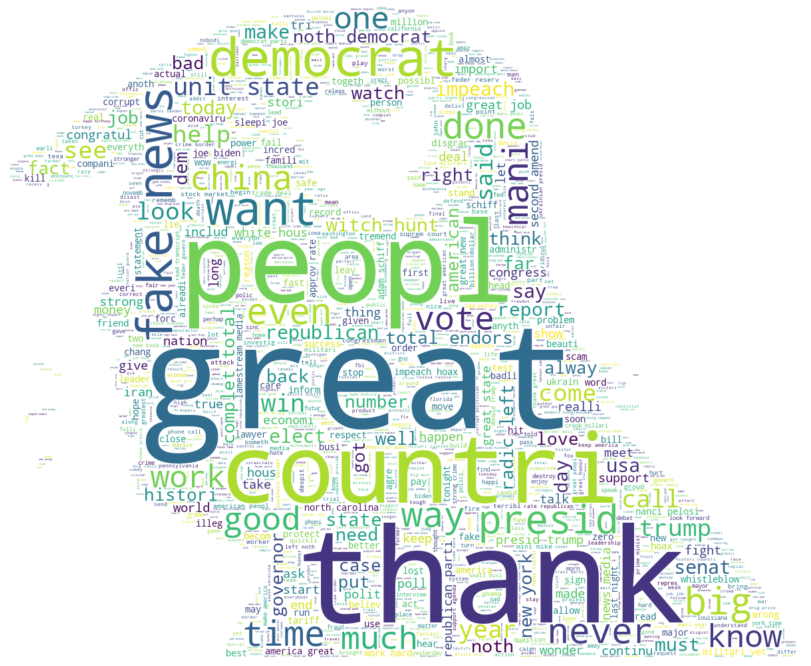

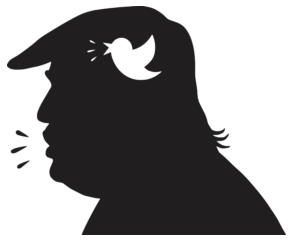

In [ ]:
# Word cloud of Trump's tweets:
column = "clean_text"
pic = "./trump_pic.jpg" 
rcParams['figure.figsize'] = 5, 5
word_cloud(df=trump_df, column=column, max_words = 2000, pic_path = pic)

###Trump Retweets

In [ ]:
# Load trump retweets:
df = pd.read_csv("trump_retweets.csv", low_memory=False)

In [ ]:
sf = tc.SFrame(df.replace({pd.np.nan: None}))
sf.save('drive/My Drive/big_data/trump_retweets.sframe')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead



In [ ]:
# Data Preprocessing:
specific_columns = ['created_at','id','source','text','in_reply_to_status_id','in_reply_to_user_id','user.id','State_abbv']
preprocessed_df = preprocessing(df=df, specific_columns = specific_columns)

Start Preprocessing
filter unknown sources
remove rows: 8510
Parse Date
Remove duplicates
After pre-proccessing DF shape is 2534751


In [ ]:
sf = tc.SFrame(preprocessed_df.replace({pd.np.nan: None}))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead



In [ ]:
sf.save('drive/My Drive/big_data/trump_retweets_filter.sframe')

In [ ]:
# Clean text:
min_text_len = 1
preprocessed_df['clean_text'] = preprocessed_df['text'].apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len))

In [ ]:
preprocessed_df = preprocessed_df[~preprocessed_df['clean_text'].isna()]

In [ ]:
# Extract sentiment:
preprocessed_df['sentiment'] = preprocessed_df['clean_text'].apply(lambda x: get_sentiment(x))

In [ ]:
sf = tc.SFrame(preprocessed_df.replace({pd.np.nan: None}))
sf.save('drive/My Drive/big_data/trump_retweets_preproccesing.sframe')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead



In [ ]:
preprocessed_df = tc.SFrame('drive/My Drive/big_data/trump_retweets_preproccesing.sframe')
preprocessed_df = preprocessed_df.to_dataframe()

###Analysis between Trump's Tweets and the replies tweets

In [ ]:
# Filter for trump retweets and replies:
trump_user_id = 25073877
trump_replies_df = preprocessed_df[preprocessed_df['in_reply_to_user_id']==f'{trump_user_id}.0'].reset_index(drop=True)
trump_replies_df['date'] = trump_replies_df['date'].apply(lambda d: d.date())
trump_replies_df_agg = trump_replies_df.groupby(['date']).mean().reset_index()

In [ ]:
trump_replies_df_agg.head(5)

,date,id,in_reply_to_status_id,user.id,sentiment
0,2019-06-01,1.134772e+18,1.134399e+18,3.350786e+17,0.035076
1,2019-06-02,1.135131e+18,1.132973e+18,3.326256e+17,0.016940
2,2019-06-03,1.135494e+18,1.133365e+18,3.163551e+17,0.030928
3,2019-06-04,1.135802e+18,1.129751e+18,3.436438e+17,0.036966
4,2019-06-05,1.136200e+18,1.132354e+18,3.377880e+17,0.048855


In [ ]:
# Filter per dates:
min_date = min(trump_df['created_at'])
trump_replies_df = trump_replies_df[trump_replies_df['date']>=min_date]

In [ ]:
# Create sentiment over time graph:
id_list = list(set(trump_df['status_id']))
trump_replies_df['status_id'] = trump_replies_df['in_reply_to_status_id'].apply(lambda x: find_status_id(id=x, id_list=id_list))

In [ ]:
print(f'After filtering the match between Trump\'s tweet and his reactions, {len(trump_replies_df[~trump_replies_df["status_id"].isna()])} lines were found')

After filtering the match between Trump's tweet and his reactions, 714622 lines were found


In [ ]:
trump_replies_sentiment_gb = trump_replies_df[['status_id','sentiment']].groupby(by='status_id').mean().reset_index()
trump_replies_sentiment_gb = trump_replies_sentiment_gb.rename(columns={'sentiment':'mean_replies_sentiment'})
trump_replies_sentiment_gb = trump_replies_sentiment_gb.dropna()

In [ ]:
# Merge with trump tweets:
new_trump_replies_df = trump_df.merge(trump_replies_sentiment_gb, on='status_id', how='left')
assert new_trump_replies_df['mean_replies_sentiment'].dropna().shape[0]==trump_replies_sentiment_gb.shape[0]

In [ ]:
new_trump_replies_df = new_trump_replies_df[['created_at','status_id','covid_tweet','sentiment','subjectivity','mean_replies_sentiment', 'replies']]

In [ ]:
# new_trump_replies_df.to_csv('drive/My Drive/big_data/trump_retweet_maches.csv',index=False)
# new_trump_replies_df = pd.read_csv('drive/My Drive/big_data/trump_retweet_maches.csv')

In [ ]:
covid_spread_state_gb = covid_spread_state_df.groupby(by='date').sum().reset_index()
new_trump_replies_df['date_str'] = new_trump_replies_df['created_at'].astype(str)

In [ ]:
new_trump_replies_df = new_trump_replies_df.merge(covid_spread_state_gb, left_on='date_str', right_on='date', how='left')

In [ ]:
new_trump_replies_df['covid cases'] = new_trump_replies_df['covid cases'].fillna(value=0)
new_trump_replies_df['covid deaths'] = new_trump_replies_df['covid deaths'].fillna(value=0)

###**Graph** Sentiment and Covid Cases

In [ ]:
all_data_df = new_trump_replies_df.groupby(by='created_at')[['sentiment','mean_replies_sentiment','subjectivity','covid cases','covid deaths', 'replies']].mean().reset_index()

In [ ]:
# all_data_df['mean_replies_sentiment'].dropna()
all_data_df.tail(5)

,created_at,sentiment,mean_replies_sentiment,subjectivity,covid cases,covid deaths,replies
400,2020-07-14,0.104167,0.030043,0.243750,65459.0,952.0,36439.000000
401,2020-07-15,0.280957,0.035560,0.389481,68085.0,969.0,22690.333333
402,2020-07-16,0.217708,0.055006,0.348958,75486.0,957.0,17063.000000
403,2020-07-17,0.108333,0.033055,0.339569,70357.0,896.0,21399.714286
404,2020-07-18,0.245238,0.007008,0.595238,62106.0,774.0,48394.666667


In [ ]:
# Create some mock data
t = all_data_df['created_at']
cases = all_data_df['covid cases']
avg = all_data_df['mean_replies_sentiment'].dropna().mean()
comment_sentiment = all_data_df['mean_replies_sentiment'].fillna(avg)
trump_sentiment = all_data_df['sentiment'] 
# subjectivity = all_data_df['subjectivity'] 

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(comment_sentiment,21,5), name="trump comments sentiment", line=dict(color='royalblue', width=2, dash='dot') ),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(trump_sentiment,51,3), name="trump tweets sentiment", line=dict(color='green', width=2, dash='dot')),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(cases,11,3), name="cases", line=dict(color='red', width=2)),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Trump Sentiment VS COVID-19 Cases"
)
# Set x-axis title
fig.update_xaxes(title_text="Day")
# Set y-axes titles
fig.update_yaxes(title_text="<b>Trump Score</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Cases</b>", secondary_y=True)
fig.show()

###HeatMap

#####General Corr HeatMap

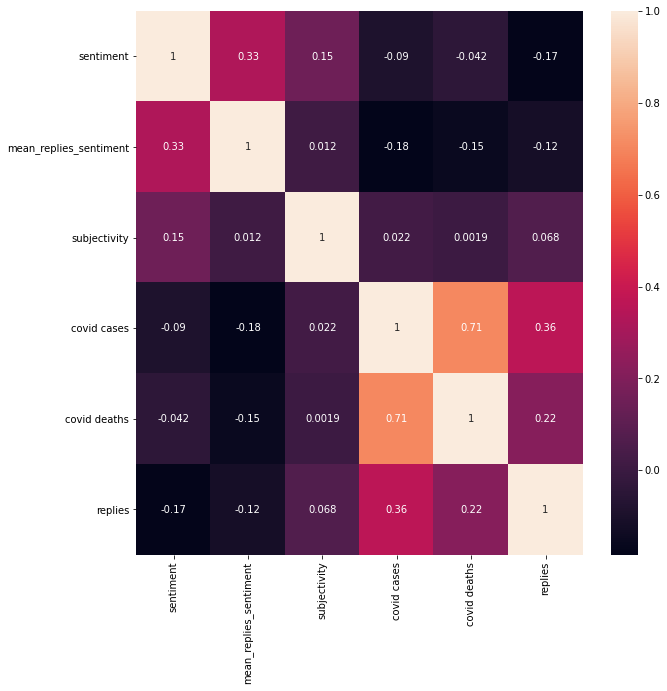

In [ ]:

# heatmap

from pylab import rcParams
rcParams['figure.figsize'] = 10, 10
a = all_data_df[['sentiment', 'mean_replies_sentiment', 'subjectivity','covid cases','covid deaths','replies' ]].corr()
sns.heatmap(a, xticklabels=a.columns, yticklabels=a.columns, annot=True)  
plt.show()

#####Covid Time Corr HeatMap

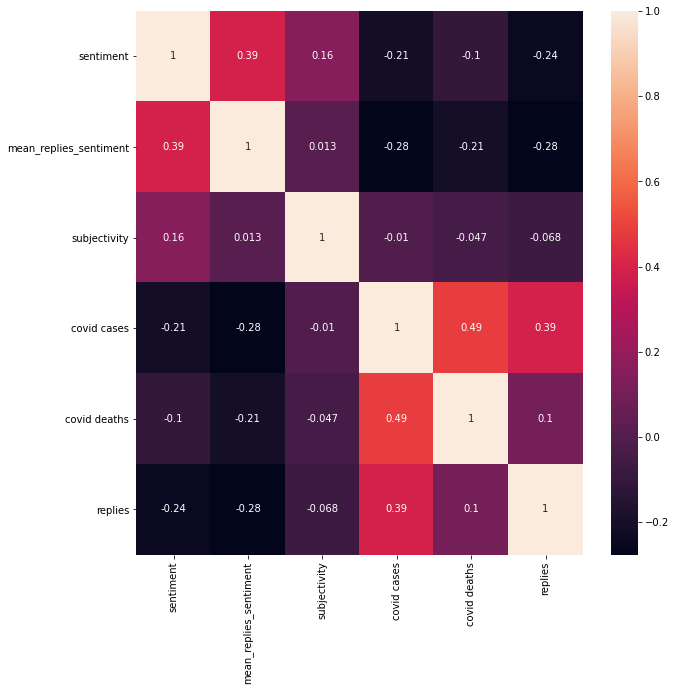

In [ ]:
covid_time_trump_agg = all_data_df[all_data_df['created_at']>pd.to_datetime('20200201',format='%Y%m%d')]
a = covid_time_trump_agg[['sentiment', 'mean_replies_sentiment', 'subjectivity','covid cases','covid deaths','replies']].corr()
sns.heatmap(a, xticklabels=a.columns, yticklabels=a.columns, annot=True)  
plt.show()

##Biden tweets

####Biden Tweets

In [ ]:
# Load Biden tweets:
biden_path ='./drive/My Drive/Colab Notebooks/Big Data/final_project/Data/other/twitts (1)/JoeBiden (1).csv'
biden_df = pd.read_csv(biden_path)
biden_df

,date,username,to,replies,retweets,favorites,text,geo,mentions,hashtags,id,permalink
0,2020-07-18 14:58:00,JoeBiden,NaN,3498,34989,155112,"I know of no man with more courage than John Lewis. He was a giant walking among us. When I saw him, I couldn’t help but think one thing: “I haven’t done enough.” May his life and legacy inspire e...",NaN,NaN,NaN,1284502687430479874,https://twitter.com/JoeBiden/status/1284502687430479874
1,2020-07-18 14:15:58,JoeBiden,NaN,890,8789,42115,My full statement:,NaN,NaN,NaN,1284492110503317504,https://twitter.com/JoeBiden/status/1284492110503317504
2,2020-07-18 14:15:58,JoeBiden,NaN,3385,27309,171686,"We are made in the image of God, and then there is John Lewis. He was truly one-of-a-kind, a moral compass who always knew where to point us and which direction to march. To John’s family, friends...",NaN,NaN,NaN,1284492109496619009,https://twitter.com/JoeBiden/status/1284492109496619009
3,2020-07-18 00:00:00,JoeBiden,NaN,3688,8282,36827,"As President, I will see to it that America once again stands for human rights. That doesn't mean rights only for some, but rights for all — each and every American, and every person, everywhere. ...",NaN,NaN,NaN,1284276699337646080,https://twitter.com/JoeBiden/status/1284276699337646080
4,2020-07-17 22:50:00,JoeBiden,AP,777,4161,21043,"Today, we lost a giant of the civil rights movement and a relentless champion in the struggle for justice. Reverend C.T. Vivian never stopped pushing our nation closer to our highest ideals — and ...",NaN,NaN,NaN,1284259082254217216,https://twitter.com/JoeBiden/status/1284259082254217216
...,...,...,...,...,...,...,...,...,...,...,...,...
3263,2019-06-11 17:55:40,JoeBiden,NaN,67,101,328,"When it comes to President Trump’s tariff war with China, one thing is clear: America’s farmers and manufacturers are getting crushed – no one knows that better than Iowa. To Trump, the people get...",NaN,NaN,#TeamJoe,1138505090275389442,https://twitter.com/JoeBiden/status/1138505090275389442
3264,2019-06-11 17:51:38,JoeBiden,NaN,319,249,2114,"Hey everyone, @TeamJoe here. We’re taking over to keep you in the loop on our event in Ottumwa, Iowa. Stay tuned! #TeamJoe",NaN,@TeamJoe,#TeamJoe,1138504076788936706,https://twitter.com/JoeBiden/status/1138504076788936706
3265,2019-06-10 22:46:00,JoeBiden,NaN,428,342,1879,I'm headed to eastern Iowa this week to talk with voters about our vision for the future. Head to http://JoeBiden.com/Events to RSVP to an event in your community.,NaN,NaN,NaN,1138215765843283969,https://twitter.com/JoeBiden/status/1138215765843283969
3266,2019-06-10 18:10:00,JoeBiden,NaN,155,233,1573,It was great to be back in Atlanta! Thank you to Mayor @KeishaBottoms for showing me around town and for your work expanding opportunity to every corner of the city.,NaN,@KeishaBottoms,NaN,1138146307921465346,https://twitter.com/JoeBiden/status/1138146307921465346


In [ ]:
# Data preprocessing:
biden_df = biden_df.rename(columns={'date': 'created_at'})
biden_df['created_at'] = biden_df['created_at'].apply(lambda x: convertDate(str(x)))
biden_df = biden_df.sort_values("created_at")
biden_df = biden_df.dropna(subset=['created_at','id','text'])
biden_df['status_id'] = biden_df['permalink'].apply(lambda x: x.split('/')[-1])

In [ ]:
# Tag corona tweets:
biden_df['covid_tweet'] = biden_df['text'].apply(lambda x: is_relevent_tweet(text=x,words_list=corona_keyword))

In [ ]:
# Clean text:
min_text_len = 1
min_word_len = 3
biden_df['clean_text'] = biden_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len, min_word_len=min_word_len, stem=True))
biden_df['clean_text_no_stem'] = biden_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len, min_word_len=min_word_len, stem=False))
biden_df = biden_df[~biden_df['clean_text'].isna()]






  0%|          | 0/3267 [00:00<?, ?it/s]




  3%|▎         | 99/3267 [00:00<00:03, 987.32it/s]




  6%|▌         | 200/3267 [00:00<00:03, 991.29it/s]




  9%|▉         | 306/3267 [00:00<00:02, 1010.48it/s]




 13%|█▎        | 426/3267 [00:00<00:02, 1060.04it/s]




 17%|█▋        | 550/3267 [00:00<00:02, 1107.80it/s]




 21%|██        | 672/3267 [00:00<00:02, 1138.47it/s]




 24%|██▍       | 799/3267 [00:00<00:02, 1172.23it/s]




 28%|██▊       | 924/3267 [00:00<00:01, 1194.50it/s]




 32%|███▏      | 1049/3267 [00:00<00:01, 1203.61it/s]




 36%|███▌      | 1172/3267 [00:01<00:01, 1210.67it/s]




 40%|███▉      | 1303/3267 [00:01<00:01, 1237.88it/s]




 44%|████▍     | 1436/3267 [00:01<00:01, 1263.44it/s]




 48%|████▊     | 1562/3267 [00:01<00:01, 1252.44it/s]




 52%|█████▏    | 1687/3267 [00:01<00:01, 1241.26it/s]




 55%|█████▌    | 1811/3267 [00:01<00:01, 1192.15it/s]




 59%|█████▉    | 1931/3267 [00:01<00:01, 1189.48it/s]




 63%|██████▎   | 2066/3267 [00:01

In [ ]:
# Extract sentiment:
biden_df['sentiment'] = biden_df['clean_text'].apply(lambda x: get_sentiment(x))  
biden_df['sentiment_desc'] = biden_df['sentiment'].apply(lambda x: sentiment_recognize(x))

In [ ]:

biden_df['subjectivity'] = biden_df['clean_text'].apply(lambda t: get_subjectivity(t))

In [ ]:
# Create pie of trump tweet sentiment:
import plotly.express as px
counts = Counter(biden_df['sentiment_desc'])
fig = px.pie( values=[float(v) for v in counts.values()], names=[k for k in counts]
                                  ,title='biden\'s tweets sentiment description')
fig.show()

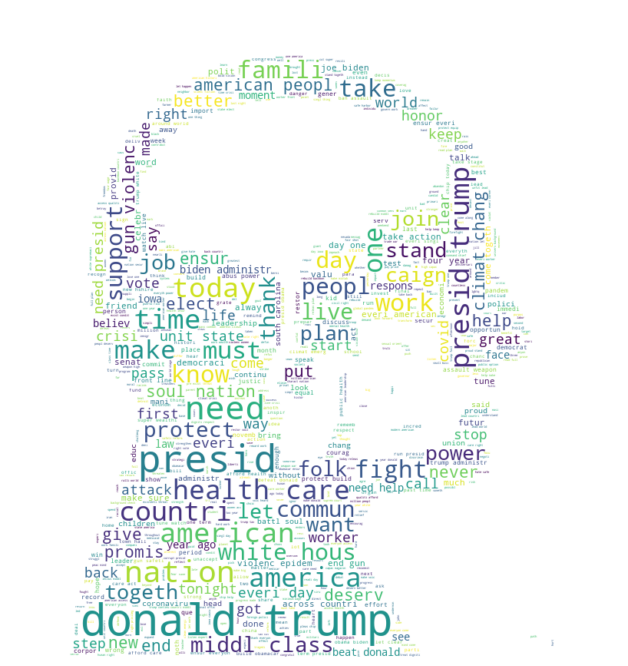

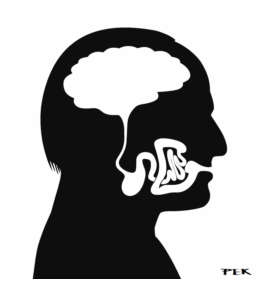

In [ ]:
# Word cloud of Trump's tweets:
column = "clean_text"
pic = "./asdf.png" 
rcParams['figure.figsize'] = 5, 5
word_cloud(df=biden_df, column=column, max_words = 4000, pic_path = pic)

###Biden Retweets

In [ ]:
# Load Biden retweets:
df = pd.read_csv("/content/drive/My Drive/big_data/tables/biden_retweets.csv", low_memory=False) 
df

,created_at,id,text,source,in_reply_to_status_id,in_reply_to_user_id,user.id,State_abbv,date,hour,date_and_hour,folder
0,20200718T180909,1.284505e+18,@ArletteSaenz @maggieNYT @JoeBiden @DrBiden So...,"<a href=""""http://twitter.com/download/iphone""""...",1.284494e+18,21878635.0,1.951878e+08,MD,20200718T000000,18.0,2020-07-18 18.0,Data/BGU DATA/Leaders Tweets and Retweets/
1,20200630T012300,1.277729e+18,@JoeBiden You're a disgrace,"<a href=""""http://twitter.com/download/android""...",1.277399e+18,939091.0,8.941870e+17,MA,20200630T000000,1.0,2020-06-30 1,Data/BGU DATA/Leaders Tweets and Retweets/
2,20200705T130604,1.279718e+18,@mcuban @JustinMRhoades @kanyewest @JoeBiden @...,"<a href=""""http://twitter.com/download/iphone""""...",1.279621e+18,16228398.0,8.479375e+17,MO,20200705T000000,13.0,2020-07-05 13,Data/BGU DATA/Leaders Tweets and Retweets/
3,20200621T135443,1.274657e+18,@bradmueller @SuzanneLindahl @iArvindKushwaha ...,"<a href=""""http://twitter.com/download/iphone""""...",1.274602e+18,1062395881.0,1.241466e+18,OR,20200621T000000,13.0,2020-06-21 13,Data/BGU DATA/Leaders Tweets and Retweets/
4,20200704T140844,1.279372e+18,"@JoeBiden \nNow, more than ever, we need a Pre...","<a href=""""http://twitter.com/download/iphone""""...",NaN,939091,1.081908e+18,NC,20200704T000000,14.0,2020-07-04 14,Data/BGU DATA/Leaders Tweets and Retweets/
...,...,...,...,...,...,...,...,...,...,...,...,...
295607,20200527T114735,1.265565e+18,@GeraldoRivera @Twitter @realDonaldTrump @JoeB...,"<a href=""""http://twitter.com/download/android""...",1.265565e+18,7.601756111973376e+17,7.601756e+17,AR,20200527T000000,11.0,2020-05-27 11,Data/BGU DATA/Leaders Tweets and Retweets/
295608,20200527T073405,1.265502e+18,@JoeBiden Absolutely !\nYou have my vote and ...,"<a href=""""http://twitter.com/download/iphone""""...",1.265327e+18,939091.0,5.064492e+07,MO,20200527T000000,7.0,2020-05-27 7,Data/BGU DATA/Leaders Tweets and Retweets/
295609,20200115T215655,1.217536e+18,@CTGOPChair @realDonaldTrump He's literally in...,"<a href=""""https://mobile.twitter.com"""" rel=""""n...",1.217515e+18,9.643242458777724e+17,9.253499e+17,VA,20200115T000000,21.0,2020-01-15 21,Data/BGU DATA/Leaders Tweets and Retweets/
295610,20190930T065903,1.178520e+18,@JoeBiden @JoeBiden u shook the American Peopl...,"<a href=""""https://mobile.twitter.com"""" rel=""""n...",1.178471e+18,939091.0,4.302802e+09,OK,20190930T000000,6.0,2019-09-30 6,Data/BGU DATA/Leaders Tweets and Retweets/


In [ ]:
sf = tc.SFrame(df.replace({pd.np.nan: None}))
sf.save('drive/My Drive/big_data/biden_retweets.sframe')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead



In [ ]:
# Data Preprocessing:
specific_columns = ['created_at','id','source','text','in_reply_to_status_id','in_reply_to_user_id','user.id','State_abbv']
preprocessed_df = preprocessing(df=df, specific_columns = specific_columns)

Start Preprocessing
filter unknown sources
remove rows: 1218
Parse Date
Remove duplicates
After pre-proccessing DF shape is 294357


In [ ]:
# Clean text:
min_text_len = 1
preprocessed_df['clean_text'] = preprocessed_df['text'].apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len))

In [ ]:
preprocessed_df = preprocessed_df[~preprocessed_df['clean_text'].isna()]

In [ ]:
# Extract sentiment:
preprocessed_df['sentiment'] = preprocessed_df['clean_text'].apply(lambda x: get_sentiment(x))

###Analysis between Biden's Tweets and the replies tweets

In [ ]:
# Filter for trump retweets and replies:
biden_user_id = 939091
biden_replies_df = preprocessed_df[preprocessed_df['in_reply_to_user_id']==f'{biden_user_id}.0'].reset_index(drop=True)
# biden_replies_df['date'] = biden_replies_df['date'].apply(lambda d: d.date())
biden_replies_df_agg = biden_replies_df.groupby(['date']).mean().reset_index()

In [ ]:
biden_replies_df_agg.head(5)

,date,id,in_reply_to_status_id,user.id,sentiment
0,2019-07-21,1.152888e+18,1.151248e+18,2.676526e+17,0.050378
1,2019-07-22,1.153239e+18,1.151327e+18,2.907205e+17,0.056595
2,2019-07-23,1.153543e+18,1.141953e+18,2.075672e+17,-0.004242
3,2019-07-24,1.153918e+18,1.146263e+18,2.931357e+17,0.009691
4,2019-07-25,1.154298e+18,1.148109e+18,1.396625e+17,0.061667


In [ ]:
# Filter per dates:
min_date = min(biden_df['created_at'])
biden_replies_df = biden_replies_df[biden_replies_df['date']>=min_date]

In [ ]:
# Create sentiment over time graph:
id_list = list(set(biden_df['status_id']))
biden_replies_df['status_id'] = biden_replies_df['in_reply_to_status_id'].apply(lambda x: find_status_id(id=x, id_list=id_list))

In [ ]:
print(f'After filtering the match between Biden\'s tweet and his reactions, {len(biden_replies_df[~biden_replies_df["status_id"].isna()])} lines were found')

After filtering the match between Biden's tweet and his reactions, 62238 lines were found


In [ ]:
biden_replies_sentiment_gb = biden_replies_df[['status_id','sentiment']].groupby(by='status_id').mean().reset_index()
biden_replies_sentiment_gb = biden_replies_sentiment_gb.rename(columns={'sentiment':'mean_replies_sentiment'})
biden_replies_sentiment_gb = biden_replies_sentiment_gb.dropna()

In [ ]:
# Merge with trump tweets:
new_biden_replies_df = biden_df.merge(biden_replies_sentiment_gb, on='status_id', how='left')
assert new_biden_replies_df['mean_replies_sentiment'].dropna().shape[0]==biden_replies_sentiment_gb.shape[0]

In [ ]:
new_biden_replies_df = new_biden_replies_df[['created_at','status_id','covid_tweet','sentiment','subjectivity','mean_replies_sentiment', 'replies']]

In [ ]:
covid_spread_state_gb = covid_spread_state_df.groupby(by='date').sum().reset_index()
new_biden_replies_df['date_str'] = new_biden_replies_df['created_at'].astype(str)

In [ ]:
new_biden_replies_df = new_biden_replies_df.merge(covid_spread_state_gb, left_on='date_str', right_on='date', how='left')

In [ ]:
new_biden_replies_df['covid cases'] = new_biden_replies_df['covid cases'].fillna(value=0)
new_biden_replies_df['covid deaths'] = new_biden_replies_df['covid deaths'].fillna(value=0)

###**Graph** sentiments and Covid Cases

In [ ]:
all_data_biden_df = new_biden_replies_df.groupby(by='created_at')[['sentiment','mean_replies_sentiment','subjectivity','covid cases','covid deaths', 'replies']].mean().reset_index()

In [ ]:
# all_data_df['mean_replies_sentiment'].dropna()
all_data_biden_df.tail(5)

,created_at,sentiment,mean_replies_sentiment,subjectivity,covid cases,covid deaths,replies
400,2020-07-14,0.164218,0.069397,0.416224,65459.0,952.0,4997.714286
401,2020-07-15,0.253053,0.055084,0.436673,68085.0,969.0,3607.333333
402,2020-07-16,-0.116429,0.006025,0.320238,75486.0,957.0,3788.600000
403,2020-07-17,0.107729,0.042465,0.269891,70357.0,896.0,8833.750000
404,2020-07-18,0.203051,0.045349,0.514509,62106.0,774.0,2865.250000


In [ ]:
# Create some mock data
t = all_data_biden_df['created_at']
cases = all_data_biden_df['covid cases']
avg = all_data_biden_df['mean_replies_sentiment'].dropna().mean()
comment_sentiment = all_data_biden_df['mean_replies_sentiment'].fillna(avg)
biden_sentiment = all_data_biden_df['sentiment'] 

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(comment_sentiment,21,5), name="Biden comments sentiment", line=dict(color='royalblue', width=2, dash='dot') ),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(biden_sentiment,51,3), name="Biden tweets sentiment", line=dict(color='green', width=2, dash='dot')),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(cases,11,3), name="cases", line=dict(color='red', width=2)),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Biden Sentiment VS COVID-19 Cases"
)
# Set x-axis title
fig.update_xaxes(title_text="Day")
# Set y-axes titles
fig.update_yaxes(title_text="<b>Biden Score</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Cases</b>", secondary_y=True)
fig.show()

###**HeatMap**

Sentiment | Mean Replies Sentiment | Subjectivity | Covid Cases | Covid Deaths Replies

#####General Corr HeatMap

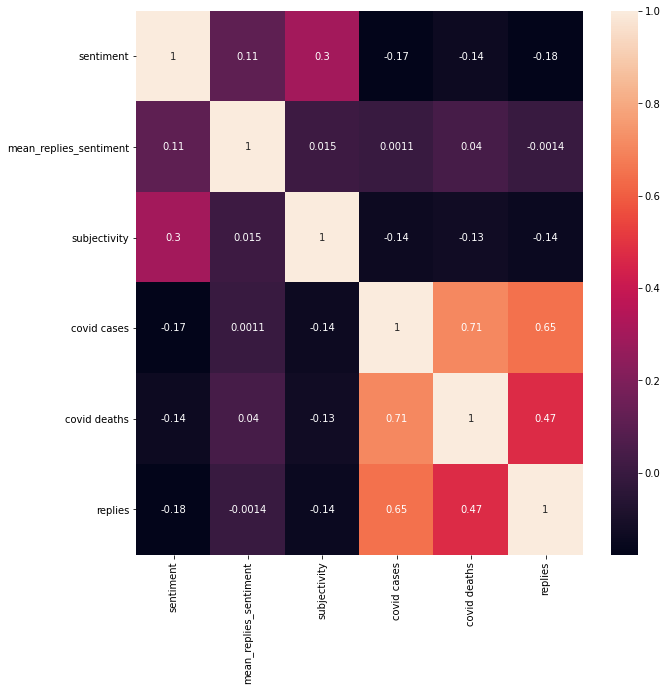

In [ ]:
# heatmap
from pylab import rcParams
rcParams['figure.figsize'] = 10, 10
a = all_data_biden_df[['sentiment', 'mean_replies_sentiment', 'subjectivity','covid cases','covid deaths','replies' ]].corr()
sns.heatmap(a, xticklabels=a.columns, yticklabels=a.columns, annot=True)  
plt.show()

#####Covid Time Corr HeatMap

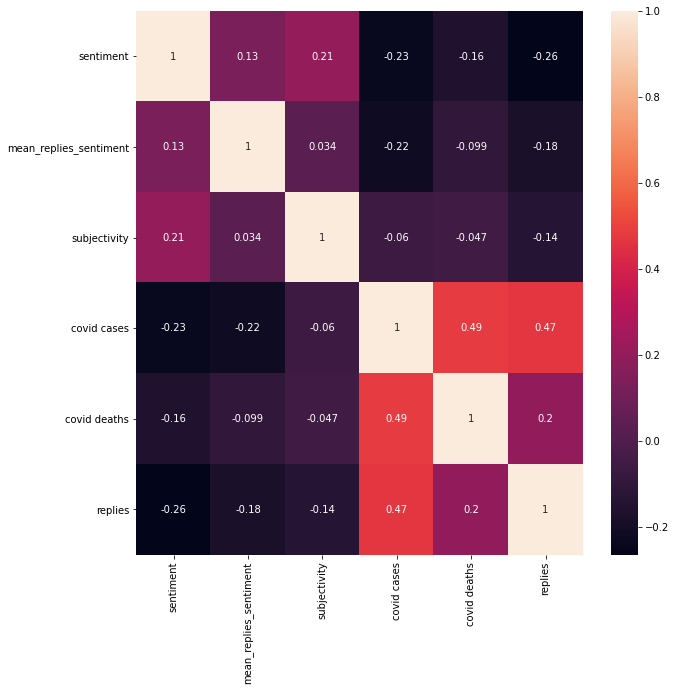

In [ ]:
covid_time_biden_agg = all_data_biden_df[all_data_biden_df['created_at']>pd.to_datetime('20200201',format='%Y%m%d')]
a = covid_time_biden_agg[['sentiment', 'mean_replies_sentiment', 'subjectivity','covid cases','covid deaths','replies']].corr()
sns.heatmap(a, xticklabels=a.columns, yticklabels=a.columns, annot=True)  
plt.show()

# Analysis of Stocks Tweets

In [40]:
stock_prices_df = pd.read_csv('/content/drive/My Drive/big_data/tables/stocks_prices.csv', index_col='Unnamed: 0')
stock_prices_df['Date'] = stock_prices_df['Date'].apply(lambda x: pd.to_datetime(x, format='%Y-%m-%d'))
stock_prices_df

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,stock,sector
0,2019-06-03,25.60,26.07,25.60,26.00,90400.0,0.0,0.0,TAN,Solar Energy
1,2019-06-04,25.98,26.31,25.92,26.22,255200.0,0.0,0.0,TAN,Solar Energy
2,2019-06-05,26.56,26.74,26.32,26.74,348600.0,0.0,0.0,TAN,Solar Energy
3,2019-06-06,26.48,26.64,26.22,26.56,91200.0,0.0,0.0,TAN,Solar Energy
4,2019-06-07,26.71,27.15,26.66,26.93,529100.0,0.0,0.0,TAN,Solar Energy
...,...,...,...,...,...,...,...,...,...,...
2297,2020-07-13,40.35,40.72,39.47,40.10,370715.0,0.0,0.0,CL=F,Crude
2298,2020-07-14,39.60,40.57,39.07,40.29,426971.0,0.0,0.0,CL=F,Crude
2299,2020-07-15,40.55,41.26,40.08,41.20,352542.0,0.0,0.0,CL=F,Crude
2300,2020-07-16,40.97,41.18,40.52,40.75,200101.0,0.0,0.0,CL=F,Crude


In [42]:
# Load data:
input_url = "/content/drive/My Drive/big_data/tables/stock_tweets.csv"
stocks_df = pd.read_csv(input_url, low_memory=False)
print(stocks_df.shape)

(694232, 13)


In [43]:
# Config:
market_relavant_words = ['s&p','nasda','vix','stock market','energy stock', 'es_f','sp5', 'S&amp;P' 'ixic']
clean_energy_relevant_words = ['nee','nextera','tsla', 'tesla','pbw','invesco wilderhill','clean energy','cleanenergy','clean_energy', 'elon musk', 'elonmask', 'elon_mask']
Crude_relevant_words = ['uco', 'bno','clf','cl=f','cl_f','black oil','blackoil','black_oil','crude','wti', 'brent','dbo','oott', 'oil trading', 'oil_trading','oiltrading','fintwit','oil price','oilprice','oil_price','usa oil', 'usoil', 'usaoil']
Solar_Energy_relevant_words = ['tan','solar']
Gasoline_relevant_word = ['gasoline','gas','uga']
dict_stock_sector  = {'Solar Energy': ['TAN'], 'Clean Energy': ['NEE', 'TSLA', 'PBW'], 'Crude': ['UCO','BNO','CL=F'], 'Gasoline': ['UGA']}

In [44]:
stocks_df['text'] = stocks_df['text'].astype(str)
stocks_df['source'] = stocks_df['source'].astype(str)
stocks_df['created_at'] = stocks_df['created_at'].astype(str)

In [45]:
# Data preprocessing:
stocks_df = stocks_df[~stocks_df['text'].str.lower().str.contains("toilet")]
cols = ['created_at','id','source', 'text','in_reply_to_status_id','in_reply_to_user_id','user.id','State_abbv']
stocks_df = preprocessing(stocks_df, specific_columns = cols)
stocks_df['sector'] = stocks_df['text'].progress_apply(lambda x: recognize_sector(x, market_relavant_words, clean_energy_relevant_words, Crude_relevant_words, Solar_Energy_relevant_words, Gasoline_relevant_word)) 
stocks_df = stocks_df[stocks_df['sector'].isin(['Clean Energy','Crude','Gasoline','Solar Energy'])]

Start Preprocessing
filter unknown sources


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:153: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



remove rows: 18469
Parse Date
Remove duplicates


  1%|          | 7607/675318 [00:00<00:08, 76066.81it/s]

After pre-proccessing DF shape is 675318


100%|██████████| 675318/675318 [00:07<00:00, 94878.97it/s]


In [46]:
stocks_df.shape[0]

73480

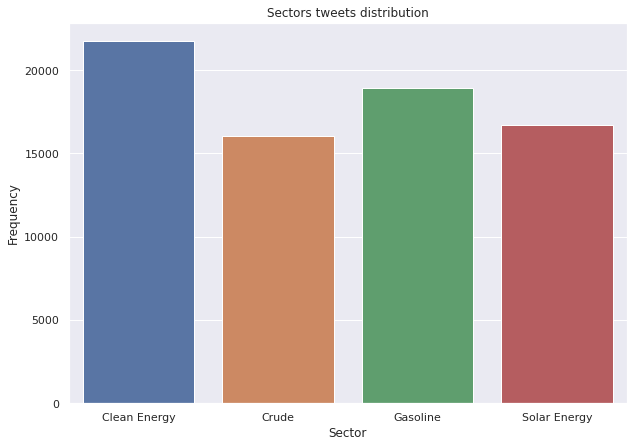

In [48]:
# Sector tweets distribution:
stocks_gb = stocks_df.groupby('sector').count()['id'].reset_index()
sns.barplot(stocks_gb['sector'],stocks_gb['id'])
sns.set(rc={'figure.figsize':(10,10)})
plt.xlabel("Sector")
plt.ylabel("Frequency")
plt.title("Sectors tweets distribution")
plt.show()

## Clean Energy

In [49]:
# Filter tweets per sector:
clean_energy_df = stocks_df[stocks_df['sector']=='Clean Energy']

In [50]:
# Load data:
clean_energy_prices = stock_prices_df[stock_prices_df['sector']=='Clean Energy']

In [ ]:
# Plot stock prices:
for stock in dict_stock_sector['Clean Energy']:
  plot_stock(df=clean_energy_prices, stock=stock)

In [51]:
# Clean text:
min_text_len = 1
min_word_len = 3
clean_energy_df['clean_text'] = clean_energy_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len,
                                                                                                  min_word_len=min_word_len, remove_hashtag=True))
clean_energy_df = clean_energy_df[~clean_energy_df['clean_text'].isna()]

100%|██████████| 21754/21754 [00:13<00:00, 1582.69it/s]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [52]:
# Extract sentiment:
clean_energy_df['sentiment'] = clean_energy_df['clean_text'].progress_apply(lambda x: get_sentiment(x))

100%|██████████| 21625/21625 [00:11<00:00, 1947.84it/s]


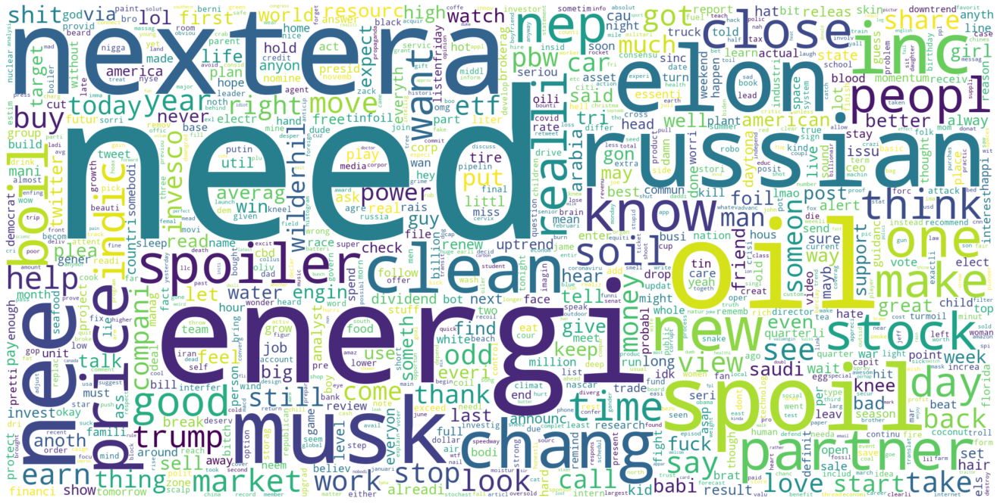

<Figure size 720x504 with 0 Axes>

In [ ]:
# Create word cloud:
word_cloud(clean_energy_df, column='clean_text', max_words = 1000)

We chose to present the PBW ETF because it best represents the sector versus the sentiment of the tweets

In [ ]:
# Plot stock prices and daily sector sentiment:
stock = 'PBW'
clean_energy_prices_stock = clean_energy_prices[clean_energy_prices['stock']==stock]
clean_energy_gb = clean_energy_df.groupby(by=['date']).mean()['sentiment'].reset_index()
clean_energy_prices_gb = clean_energy_prices_stock.groupby(by=['Date']).mean()[['Open','High','Low','Close']].reset_index()
clean_energy_prices_gb['Date'] = clean_energy_prices_gb['Date'].astype(str)
clean_energy_gb['date'] = clean_energy_gb['date'].astype(str)
clean_energy_stock = clean_energy_gb.merge(clean_energy_prices_gb, how='inner', right_on='Date', left_on='date')
plot_stock_sentiment(stock_gb=clean_energy_stock)

## Solar Energy

In [ ]:
# Filter tweets per sector:
solar_energy_df = stocks_df[stocks_df['sector']=='Solar Energy']

In [ ]:
# Load data:
solar_energy_prices = stock_prices_df[stock_prices_df['sector']=='Solar Energy']

In [ ]:
# Plot stock prices:
for stock in dict_stock_sector['Solar Energy']:
  plot_stock(df=solar_energy_prices, stock=stock)

In [ ]:
# Clean text:
min_text_len = 1
min_word_len = 3
solar_energy_df['clean_text'] = solar_energy_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len,
                                                                                                  min_word_len=min_word_len, remove_hashtag=True))
solar_energy_df = solar_energy_df[~solar_energy_df['clean_text'].isna()]






  0%|          | 0/16717 [00:00<?, ?it/s]




  1%|          | 189/16717 [00:00<00:08, 1886.69it/s]




  2%|▏         | 396/16717 [00:00<00:08, 1935.79it/s]




  4%|▎         | 588/16717 [00:00<00:08, 1929.52it/s]




  4%|▍         | 736/16717 [00:00<00:09, 1766.05it/s]




  6%|▌         | 922/16717 [00:00<00:08, 1792.84it/s]




  7%|▋         | 1118/16717 [00:00<00:08, 1839.38it/s]




  8%|▊         | 1313/16717 [00:00<00:08, 1868.59it/s]




  9%|▉         | 1513/16717 [00:00<00:07, 1905.50it/s]




 10%|█         | 1694/16717 [00:00<00:08, 1836.80it/s]




 11%|█▏        | 1886/16717 [00:01<00:07, 1859.87it/s]




 12%|█▏        | 2081/16717 [00:01<00:07, 1884.37it/s]




 14%|█▎        | 2267/16717 [00:01<00:07, 1866.18it/s]




 15%|█▍        | 2458/16717 [00:01<00:07, 1877.85it/s]




 16%|█▌        | 2645/16717 [00:01<00:07, 1870.46it/s]




 17%|█▋        | 2834/16717 [00:01<00:07, 1875.13it/s]




 18%|█▊        | 3030/16717 [00:01<00:07, 1899.34it/s]




 19%|█▉   

In [ ]:
# Extract sentiment:
solar_energy_df['sentiment'] = solar_energy_df['clean_text'].progress_apply(lambda x: get_sentiment(x))






  0%|          | 0/16159 [00:00<?, ?it/s]




  2%|▏         | 250/16159 [00:00<00:06, 2499.47it/s]




  3%|▎         | 492/16159 [00:00<00:06, 2474.58it/s]




  4%|▍         | 722/16159 [00:00<00:06, 2418.89it/s]




  6%|▌         | 962/16159 [00:00<00:06, 2412.09it/s]




  7%|▋         | 1203/16159 [00:00<00:06, 2409.19it/s]




  9%|▉         | 1451/16159 [00:00<00:06, 2428.91it/s]




 10%|█         | 1669/16159 [00:00<00:06, 2348.32it/s]




 12%|█▏        | 1895/16159 [00:00<00:06, 2319.03it/s]




 13%|█▎        | 2122/16159 [00:00<00:06, 2301.43it/s]




 15%|█▍        | 2374/16159 [00:01<00:05, 2360.82it/s]




 16%|█▌        | 2625/16159 [00:01<00:05, 2402.02it/s]




 18%|█▊        | 2875/16159 [00:01<00:05, 2427.97it/s]




 19%|█▉        | 3115/16159 [00:01<00:05, 2411.31it/s]




 21%|██        | 3360/16159 [00:01<00:05, 2420.95it/s]




 22%|██▏       | 3601/16159 [00:01<00:05, 2415.92it/s]




 24%|██▍       | 3846/16159 [00:01<00:05, 2425.14it/s]




 25%|██▌ 

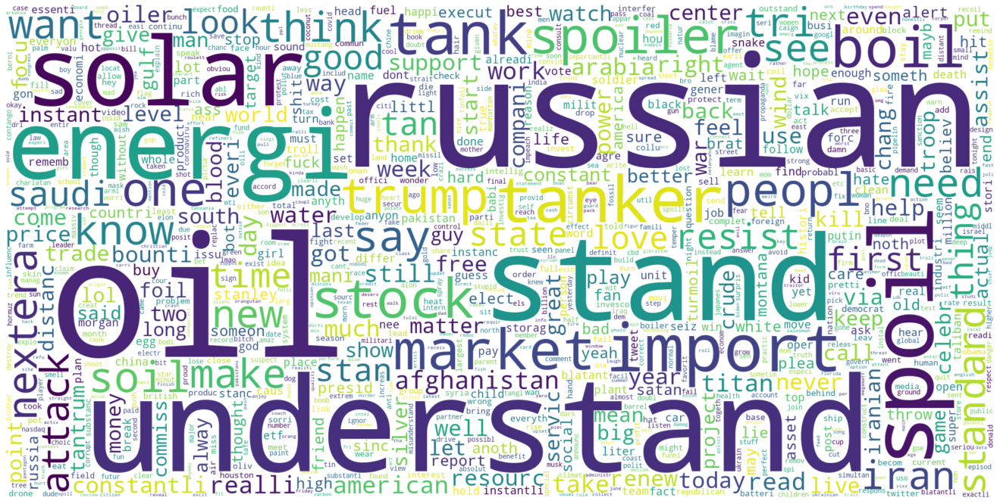

<Figure size 720x504 with 0 Axes>

In [ ]:
# Create word cloud:
word_cloud(solar_energy_df, column='clean_text', max_words = 1000)

In [ ]:
# Plot stock prices and daily sector sentiment:
stock = 'TAN'
solar_energy_prices_stock = solar_energy_prices[solar_energy_prices['stock']==stock]
solar_energy_gb = solar_energy_df.groupby(by=['date']).mean()['sentiment'].reset_index()
solar_energy_prices_gb = solar_energy_prices_stock.groupby(by=['Date']).mean()[['Open','High','Low','Close']].reset_index()
solar_energy_gb['date'] = solar_energy_gb['date'].astype(str)
solar_energy_prices_gb['Date'] = solar_energy_prices_gb['Date'].astype(str)


solar_energy_stock = solar_energy_gb.merge(solar_energy_prices_gb, how='inner', right_on='Date', left_on='date')
plot_stock_sentiment(stock_gb=solar_energy_stock)
solar_energy_stock

,date,sentiment,Date,Open,High,Low,Close
0,2019-06-03,0.044100,2019-06-03,25.60,26.07,25.60,26.00
1,2019-06-04,0.014046,2019-06-04,25.98,26.31,25.92,26.22
2,2019-06-05,-0.011275,2019-06-05,26.56,26.74,26.32,26.74
3,2019-06-06,0.089120,2019-06-06,26.48,26.64,26.22,26.56
4,2019-06-07,0.007016,2019-06-07,26.71,27.15,26.66,26.93
...,...,...,...,...,...,...,...
278,2020-07-13,0.033383,2020-07-13,41.82,43.07,40.97,41.02
279,2020-07-14,0.091453,2020-07-14,40.73,43.05,40.31,43.01
280,2020-07-15,0.043727,2020-07-15,43.62,44.07,43.06,43.83
281,2020-07-16,0.072252,2020-07-16,43.26,43.42,42.61,42.88


## Crude

In [ ]:
# Filter tweets per sector:
crude_df = stocks_df[stocks_df['sector']=='Crude']

In [ ]:
# Load data:
crude_prices = stock_prices_df[stock_prices_df['sector']=='Crude']

In [ ]:
# Plot stock prices:
for stock in dict_stock_sector['Crude']:
  plot_stock(df=crude_prices, stock=stock)

In [ ]:
# Clean text:
min_text_len = 1
min_word_len = 3
crude_df['clean_text'] = crude_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len,
                                                                                                  min_word_len=min_word_len, remove_hashtag=True))
crude_df = crude_df[~crude_df['clean_text'].isna()]






  0%|          | 0/16073 [00:00<?, ?it/s]




  1%|          | 184/16073 [00:00<00:08, 1837.70it/s]




  2%|▏         | 375/16073 [00:00<00:08, 1858.31it/s]




  3%|▎         | 548/16073 [00:00<00:08, 1816.74it/s]




  4%|▍         | 723/16073 [00:00<00:08, 1793.43it/s]




  6%|▌         | 897/16073 [00:00<00:08, 1774.73it/s]




  7%|▋         | 1075/16073 [00:00<00:08, 1774.70it/s]




  8%|▊         | 1249/16073 [00:00<00:08, 1763.40it/s]




  9%|▉         | 1418/16073 [00:00<00:08, 1738.46it/s]




 10%|▉         | 1603/16073 [00:00<00:08, 1768.91it/s]




 11%|█         | 1784/16073 [00:01<00:08, 1779.41it/s]




 12%|█▏        | 1957/16073 [00:01<00:08, 1761.39it/s]




 13%|█▎        | 2144/16073 [00:01<00:07, 1791.26it/s]




 15%|█▍        | 2334/16073 [00:01<00:07, 1820.93it/s]




 16%|█▌        | 2515/16073 [00:01<00:07, 1807.28it/s]




 17%|█▋        | 2696/16073 [00:01<00:07, 1806.18it/s]




 18%|█▊        | 2876/16073 [00:01<00:07, 1802.49it/s]




 19%|█▉   

In [ ]:
# Extract sentiment:
crude_df['sentiment'] = crude_df['clean_text'].progress_apply(lambda x: get_sentiment(x))






  0%|          | 0/15910 [00:00<?, ?it/s]




  1%|▏         | 226/15910 [00:00<00:06, 2252.03it/s]




  3%|▎         | 461/15910 [00:00<00:06, 2280.48it/s]




  4%|▍         | 690/15910 [00:00<00:06, 2281.64it/s]




  6%|▌         | 933/15910 [00:00<00:06, 2323.34it/s]




  7%|▋         | 1170/15910 [00:00<00:06, 2336.75it/s]




  9%|▊         | 1384/15910 [00:00<00:06, 2270.99it/s]




 10%|█         | 1606/15910 [00:00<00:06, 2255.33it/s]




 12%|█▏        | 1837/15910 [00:00<00:06, 2270.43it/s]




 13%|█▎        | 2080/15910 [00:00<00:05, 2313.31it/s]




 15%|█▍        | 2326/15910 [00:01<00:05, 2354.82it/s]




 16%|█▌        | 2561/15910 [00:01<00:05, 2352.05it/s]




 18%|█▊        | 2807/15910 [00:01<00:05, 2381.71it/s]




 19%|█▉        | 3043/15910 [00:01<00:05, 2361.55it/s]




 21%|██        | 3288/15910 [00:01<00:05, 2385.83it/s]




 22%|██▏       | 3526/15910 [00:01<00:05, 2281.68it/s]




 24%|██▎       | 3755/15910 [00:01<00:05, 2242.39it/s]




 25%|██▌ 

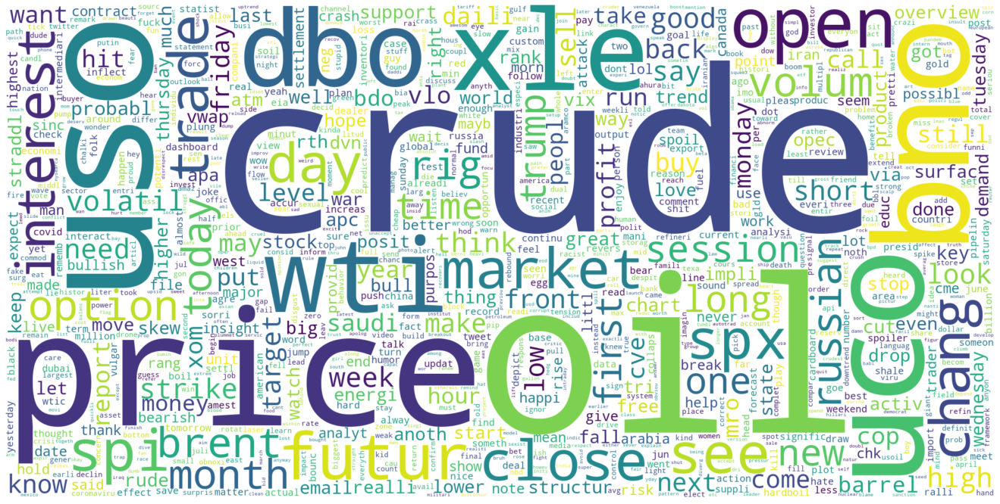

<Figure size 720x504 with 0 Axes>

In [ ]:
# Create word cloud:
word_cloud(crude_df, column='clean_text', max_words = 1000)

In [ ]:
# Plot stock prices and daily sector sentiment:
for stock in dict_stock_sector['Crude']:
  crude_prices_stock = crude_prices[crude_prices['stock']==stock]
  crude_gb = crude_df.groupby(by=['date']).mean()['sentiment'].reset_index()
  crude_prices_gb = crude_prices_stock.groupby(by=['Date']).mean()[['Open','High','Low','Close']].reset_index()

  crude_gb['date'] = crude_gb['date'].astype(str)
  crude_prices_gb['Date'] = crude_prices_gb['Date'].astype(str)


  crude_stock = crude_gb.merge(crude_prices_gb, how='inner', right_on='Date', left_on='date')
  plot_stock_sentiment(stock_gb=crude_stock)

## Gasoline

In [ ]:
# Filter tweets per sector:
gasoline_df = stocks_df[stocks_df['sector']=='Gasoline']

In [ ]:
# Load data:
gasoline_prices = stock_prices_df[stock_prices_df['sector']=='Gasoline']

In [ ]:
# Plot stock prices:
for stock in dict_stock_sector['Gasoline']:
  plot_stock(df=gasoline_prices, stock=stock)

In [ ]:
# Clean text:
min_text_len = 1
min_word_len = 3
gasoline_df['clean_text'] = gasoline_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len,
                                                                                                  min_word_len=min_word_len, remove_hashtag=True))
gasoline_df = gasoline_df[~gasoline_df['clean_text'].isna()]






  0%|          | 0/18936 [00:00<?, ?it/s]




  1%|          | 180/18936 [00:00<00:10, 1793.44it/s]




  2%|▏         | 357/18936 [00:00<00:10, 1785.01it/s]




  3%|▎         | 545/18936 [00:00<00:10, 1808.75it/s]




  4%|▍         | 722/18936 [00:00<00:10, 1796.81it/s]




  5%|▍         | 904/18936 [00:00<00:10, 1802.11it/s]




  6%|▌         | 1092/18936 [00:00<00:09, 1824.46it/s]




  7%|▋         | 1278/18936 [00:00<00:09, 1832.38it/s]




  8%|▊         | 1470/18936 [00:00<00:09, 1857.16it/s]




  9%|▊         | 1646/18936 [00:00<00:09, 1803.03it/s]




 10%|▉         | 1820/18936 [00:01<00:09, 1773.37it/s]




 11%|█         | 2002/18936 [00:01<00:09, 1786.54it/s]




 12%|█▏        | 2187/18936 [00:01<00:09, 1802.82it/s]




 12%|█▏        | 2366/18936 [00:01<00:09, 1759.77it/s]




 13%|█▎        | 2541/18936 [00:01<00:09, 1720.42it/s]




 14%|█▍        | 2728/18936 [00:01<00:09, 1761.69it/s]




 15%|█▌        | 2920/18936 [00:01<00:08, 1806.05it/s]




 16%|█▋   

In [ ]:
# Extract sentiment:
gasoline_df['sentiment'] = gasoline_df['clean_text'].progress_apply(lambda x: get_sentiment(x))






  0%|          | 0/18669 [00:00<?, ?it/s]




  1%|▏         | 251/18669 [00:00<00:07, 2503.54it/s]




  3%|▎         | 499/18669 [00:00<00:07, 2495.87it/s]




  4%|▍         | 746/18669 [00:00<00:07, 2485.39it/s]




  5%|▌         | 980/18669 [00:00<00:07, 2437.63it/s]




  6%|▋         | 1200/18669 [00:00<00:07, 2360.23it/s]




  8%|▊         | 1441/18669 [00:00<00:07, 2372.84it/s]




  9%|▉         | 1677/18669 [00:00<00:07, 2368.62it/s]




 10%|█         | 1927/18669 [00:00<00:06, 2404.55it/s]




 12%|█▏        | 2167/18669 [00:00<00:06, 2401.02it/s]




 13%|█▎        | 2409/18669 [00:01<00:06, 2405.28it/s]




 14%|█▍        | 2659/18669 [00:01<00:06, 2432.50it/s]




 16%|█▌        | 2908/18669 [00:01<00:06, 2448.00it/s]




 17%|█▋        | 3150/18669 [00:01<00:06, 2406.69it/s]




 18%|█▊        | 3389/18669 [00:01<00:06, 2399.84it/s]




 19%|█▉        | 3634/18669 [00:01<00:06, 2412.68it/s]




 21%|██        | 3875/18669 [00:01<00:06, 2411.75it/s]




 22%|██▏ 

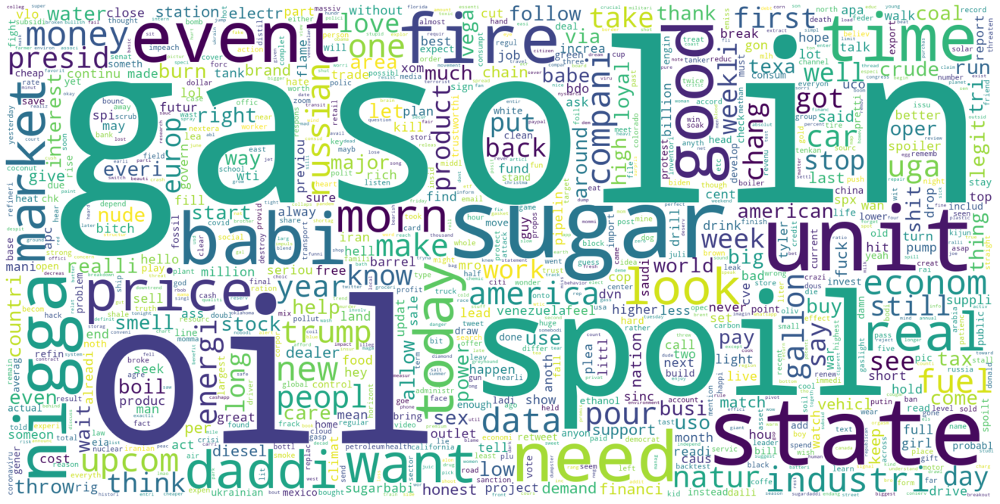

<Figure size 720x504 with 0 Axes>

In [ ]:
# Create word cloud:
word_cloud(gasoline_df, column='clean_text', max_words = 1000)

In [ ]:
# Plot stock prices and daily sector sentiment:
stock = 'UGA'
gasoline_prices_stock = gasoline_prices[gasoline_prices['stock']==stock]
gasoline_gb = gasoline_df.groupby(by=['date']).mean()['sentiment'].reset_index()
gasoline_prices_gb = gasoline_prices_stock.groupby(by=['Date']).mean()[['Open','High','Low','Close']].reset_index()
gasoline_gb['date'] = gasoline_gb['date'].astype(str)
gasoline_prices_gb['Date'] = gasoline_prices_gb['Date'].astype(str)


gasoline_stock = gasoline_gb.merge(gasoline_prices_gb, how='inner', right_on='Date', left_on='date')
plot_stock_sentiment(stock_gb=gasoline_stock)

# Analysis of Covid-19 Tweets

##Load Data

In [ ]:
# Load data:
covid_spread_state_gb = pd.read_csv("drive/My Drive/Colab Notebooks/Big Data/final_project/Output/covid_spread_state_gb.csv")
corona_per_dates_gb = pd.read_csv("drive/My Drive/Colab Notebooks/Big Data/final_project/Output/corona_per_dates_gb.csv")

In [ ]:
input_url = './drive/My Drive/big_data/tables/covid Tweets.csv'
covid_df = pd.read_csv(input_url,low_memory=False)
covid_df

,created_at,id,text,source,in_reply_to_status_id,in_reply_to_user_id,user.id,State_abbv,date,hour,date_and_hour,folder
0,20200428T232406,1.255231e+18,Trump to order meat plants to stay open in pandemic. Safety be damned. Trump can’t stand a day without his burgers. https://t.co/dSOg32GpsV,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>",NaN,NaN,1.847131e+07,ID,20200428T000000,23.0,2020-04-28 23,Data/BGU DATA/Covid Tweets/
1,20200408T200939,1.247935e+18,"You know one thing I've learned during this lockdown when it comes to going out (bars, brunch, etc)? That I really… https://t.co/EDOuVzNI7r","<a href=""""https://mobile.twitter.com"""" rel=""""nofollow"""">Twitter Web App</a>",NaN,NaN,1.030198e+08,TX,20200408T000000,20.0,2020-04-08 20,Data/BGU DATA/Covid Tweets/
2,20200318T140334,1.240247e+18,We need to stop killing people so the world can get over this pandemic--that means the entire world. https://t.co/n8aXl8KSBg,"<a href=""""https://mobile.twitter.com"""" rel=""""nofollow"""">Twitter Web App</a>",NaN,NaN,8.083698e+17,OR,20200318T000000,14.0,2020-03-18 14,Data/BGU DATA/Covid Tweets/
3,20200626T173803,1.276525e+18,Uhmmm there is a pandemic on bro https://t.co/KtVN4wPgQq,"<a href=""""http://twitter.com/download/android"""" rel=""""nofollow"""">Twitter for Android</a>",NaN,NaN,4.280941e+08,CO,20200626T000000,17.0,2020-06-26 17,Data/BGU DATA/Covid Tweets/
4,20200412T080658,1.249202e+18,Reset the atmosphere in your home. It’s time to spiritually cleanse your house. Sweep out those spiritual cob webs… https://t.co/ZAmYpYjUgb,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>",NaN,NaN,9.133099e+17,HI,20200412T000000,8.0,2020-04-12 8,Data/BGU DATA/Covid Tweets/
...,...,...,...,...,...,...,...,...,...,...,...,...
2245747,20200331T040852,1.244794e+18,I might as well do heavy full body workouts everyday or every other day during this social distancing 🦁💪 #RealMenPumpIron,"<a href=""""https://mobile.twitter.com"""" rel=""""nofollow"""">Twitter Web App</a>",NaN,NaN,4.093943e+09,KY,20200331T000000,4.0,2020-03-31 4,Data/BGU DATA/Covid Tweets/
2245748,20200224T192655,1.231994e+18,@erinkrakow @hallmarkchannel @SCHeartHome And shootouts,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>",1.231756e+18,288378863.0,4.328464e+08,SC,20200224T000000,19.0,2020-02-24 19,Data/BGU DATA/Covid Tweets/
2245749,20200704T053603,1.279243e+18,"@brat2381 According to the White House’s COVID plan, I guess she should just deal with it.","<a href=""""http://twitter.com/#!/download/ipad"""" rel=""""nofollow"""">Twitter for iPad</a>",1.279242e+18,8.599938030667162e+17,2.209607e+09,MI,20200704T000000,5.0,2020-07-04 5.0,Data/BGU DATA/Covid Tweets/
2245750,20200720T040425,1.285018e+18,Day #128 of #socialdistancing #QuarantineLife https://t.co/2CMnbvZKIK,"<a href=""""http://twitter.com/download/android"""" rel=""""nofollow"""">Twitter for Android</a>",NaN,NaN,4.040109e+07,TN,20200720T000000,4.0,2020-07-20 4.0,Data/BGU DATA/Covid Tweets/


##Data preprocessing

In [ ]:
# Data preprocessing:
cols = ['created_at','id','source', 'text','in_reply_to_status_id','in_reply_to_user_id','user.id','State_abbv']
covid_df = preprocessing(covid_df, specific_columns = cols)

**Graph show covid cases and Number of Tweets Per Day**

In [ ]:
# Covid tweets count over time:
tweet_count_gb = covid_df.groupby(by='date').count()['id'].reset_index()
tweet_count_gb = tweet_count_gb.rename(columns={'id':'count'})
tweet_count_gb['date'] = tweet_count_gb['date'].astype(str)
tweet_count_with_covid_gb = tweet_count_gb.merge(corona_per_dates_gb, how='left', on='date')
tweet_count_with_covid_gb['covid cases'] = tweet_count_with_covid_gb['covid cases'].fillna(value=0)

t = tweet_count_with_covid_gb['date']
count = tweet_count_with_covid_gb['count']
cases = tweet_count_with_covid_gb['covid cases']
deaths = tweet_count_with_covid_gb['covid deaths']

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(cases,21,5), name="Covid Cases", line=dict(color='red', width=2, dash='dot') ),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(count,11,3), name="Covid Tweets Count", line=dict(color='green', width=2)),
    secondary_y=True,
)

fig.update_layout(
    title_text="Covid tweets count over time in USA"
)
fig.update_xaxes(title_text="Day")
fig.update_yaxes(title_text="<b>Covid-19 Cases</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Covid-19 Tweets Count</b>", secondary_y=True)
fig.show()

##Clean Text and Features Extract

In [ ]:
%%time
# Clean text:
min_text_len = 2
min_word_len = 3
covid_df['clean_text'] = covid_df['text'].apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len,
                                                                                    min_word_len=min_word_len, remove_hashtag=False))
covid_df = covid_df[~covid_df['clean_text'].isna()]

CPU times: user 18min 36s, sys: 33.6 s, total: 19min 10s
Wall time: 19min 11s


In [ ]:
%%time
covid_df['clean_text_w2v'] = covid_df['text'].apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len,min_word_len=min_word_len))   
covid_df = covid_df[~covid_df['clean_text_w2v'].isna()]                                                                 

CPU times: user 16min 50s, sys: 32.4 s, total: 17min 22s
Wall time: 17min 24s


In [ ]:
%%time
# Extract sentiment:
covid_df['sentiment'] = covid_df['clean_text_w2v'].progress_apply(lambda x: get_sentiment(x))

In [ ]:
# covid_df = pd.read_csv('./drive/My Drive/big_data/clean_files/clean_covid_tweets2.csv',engine='python' )
covid_df = pd.read_csv('clean_covid_tweets.csv',low_memory=False )
covid_df

,Unnamed: 0,created_at,id,source,text,in_reply_to_status_id,in_reply_to_user_id,user.id,State_abbv,source_clean,date,clean_text,clean_text_w2v,sentiment
0,0,2019-06-01 03:00:11,1.134611e+18,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>","It’s been even more infuriating since I’ve had kids and they have to do regular “lockdown” drills...Terrifying, dep… https://t.co/Dw6Kc0x0fc",NaN,NaN,1.383198e+09,NC,iPhone,2019-06-01,even infuri sinc kid regular covid drill terrifi dep,even infuri sinc kid regular lockdown drill terrifi dep,0.000000
1,1,2019-06-01 03:00:31,1.134611e+18,"<a href=""""http://twitter.com/download/android"""" rel=""""nofollow"""">Twitter for Android</a>",@Kokomothegreat @realDonaldTrump They're not going to give a shit until it happens to one of their own family members.,1.134610e+18,8.813367e+17,1.060328e+18,IL,Android,2019-06-01,give shit covid one famili member,give shit happen one famili member,-0.200000
2,2,2019-06-01 03:18:37,1.134615e+18,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>",Happy Friday! We shipped our thank you gifts for the fund drive today! Let us know when you get them! https://t.co/sUOp7CebO3,NaN,NaN,3.035490e+09,NH,iPhone,2019-06-01,happi friday shi covid thank gift fund drive today let know get,happi friday ship thank gift fund drive today let know get,0.000000
3,3,2019-06-01 03:36:44,1.134620e+18,"<a href=""""http://twitter.com/download/android"""" rel=""""nofollow"""">Twitter for Android</a>",@SaraCarterDC @seanhannity @realDonaldTrump Something needs to happen soon. This crap is getting old fast.,1.134613e+18,2.520227e+07,9.479050e+17,KS,Android,2019-06-01,someth need covid soon crap get old fast,someth need happen soon crap get old fast,-0.166667
4,4,2019-06-01 03:42:05,1.134621e+18,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>",@MarkDice and @realDonaldTrump here is an authentic video of @tedlieu celebrating a recent appearance on… https://t.co/ddegXCSPDz,NaN,3.503949e+07,8.163895e+17,DE,iPhone,2019-06-01,authent video celebr recent covid aranc,authent video celebr recent appear,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2133362,2186963,2020-07-21 02:59:44,1.285364e+18,"<a href=""""http://twitter.com/download/android"""" rel=""""nofollow"""">Twitter for Android</a>",@ReElect_Nobody He'd only be a miracle worker by going away he's by far the worst thing to happen to this country,1.285362e+18,1.259555e+18,1.217367e+18,MI,Android,2020-07-21,miracl worker away far worst thing covid countri,miracl worker away far worst thing happen countri,-0.450000
2133363,2186964,2020-07-21 02:59:45,1.285364e+18,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>",@VincentCrypt46 I don’t see why charades are necessary. I’m over all the nonsense.I won’t wear a mask. Over it and… https://t.co/JELmnrsDMA,1.285354e+18,1.093774e+18,4.622079e+07,SD,iPhone,2020-07-21,see charad necessari nonsens covid,see charad necessari nonsens wear mask,0.000000
2133364,2186965,2020-07-21 02:59:52,1.285364e+18,"<a href=""""https://mobile.twitter.com"""" rel=""""nofollow"""">Twitter Web App</a>",Update: Health department now links 38 COVID-19 cases to Hazard High School football team; almost half are contacts… https://t.co/QVkkzdT92h,NaN,NaN,8.816883e+17,KY,Mobile device,2020-07-21,updat health depart link covid case hazard high school footbal team almost half contact,updat health depart link covid case hazard high school footbal team almost half contact,-0.003333
2133365,2186966,2020-07-21 02:59:54,1.285364e+18,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>","That’s pandemic baseball, suzyn https://t.co/EfzLBaaRFw",NaN,NaN,3.451063e+08,NY,iPhone,2020-07-21,covid basebal suzyn,pandem basebal suzyn,0.000000


**Map show sentiment over time by County (Hover Mouse: Covid-Cases and Covid-Deaths)**

In [ ]:
# USA covid tweets sentiment:
covid_per_country_df = covid_df.groupby(by=['date','State_abbv']).mean().reset_index()
covid_per_country_df['date'] = covid_per_country_df['date'].apply(lambda x: str(x).replace(" 00:00:00",''))
covid_per_country_gb = covid_per_country_df.merge(covid_spread_state_gb, on=['date','State_abbv'], how='left')
covid_per_country_gb['covid cases'] = covid_per_country_gb['covid cases'].fillna(value=0) 
covid_per_country_gb['covid deaths'] = covid_per_country_gb['covid deaths'].fillna(value=0)
covid_per_country_gb['covid cases'] = covid_per_country_gb['covid cases'].astype(int)
covid_per_country_gb['covid deaths'] = covid_per_country_gb['covid deaths'].astype(int)
covid_per_country_gb = covid_per_country_gb[['date','State_abbv','sentiment','covid cases','covid deaths']]
px.choropleth(covid_per_country_gb, locations='State_abbv',
              locationmode='USA-states', scope="usa", hover_data=['covid cases','covid deaths'], color='sentiment',animation_frame="date", color_continuous_scale="ylgn", title="Covid tweets sentiment per state")

##Topic Model

#####prepare data

In [ ]:
%%time
# Create doc per day:
covid_df['tokens_t'] = covid_df['clean_text'].apply(lambda x: x.split())

CPU times: user 3.79 s, sys: 639 ms, total: 4.43 s
Wall time: 4.43 s


In [ ]:
%%time
covid_df['tokens_w'] = covid_df['clean_text_w2v'].apply(lambda x: x.split())

CPU times: user 3.58 s, sys: 642 ms, total: 4.22 s
Wall time: 4.22 s


In [ ]:
# Create bigrams:
min_count=5
threshold=100
covid_bigram = gensim.models.Phrases(covid_df['tokens_t'], min_count=min_count, threshold=threshold)
covid_bigram_mod = gensim.models.phrases.Phraser(covid_bigram)
covid_unigram_and_bigram = [covid_bigram_mod[tweet] for tweet in covid_df['tokens_t']]
# Create Dictionary:
covid_id2word = corpora.Dictionary(covid_unigram_and_bigram)

# Term Document Frequency:
covid_corpus = [covid_id2word.doc2bow(tweet) for tweet in covid_unigram_and_bigram]

In [ ]:
from gensim.corpora import Dictionary
basic_gensim_path = "/content/drive/My Drive/big_data/models/lda/utils/"
# covid_id2word.save_as_text(basic_gensim_path + "covid_id2word.gensim")
# save_pickle_object(covid_corpus,'covid_corpus', basic_gensim_path)
covid_id2word = Dictionary.load_from_text(basic_gensim_path + "covid_id2word.gensim")
covid_corpus = load_pickle_object('covid_corpus',basic_gensim_path)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:254: UserWarning:

This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function



Info: uploading covid_corpus pickle file.


#####Build LDA model

In [ ]:
# Build LDA model:
from gensim.models.callbacks import PerplexityMetric
perplexity_logger = PerplexityMetric(corpus=covid_corpus, logger='shell')

# Config:
num_topics = 4
random_state = 11
update_every = 1
chunksize = 5000
passes=10
alpha='auto'
per_word_topics=True

warnings.filterwarnings("ignore",category=DeprecationWarning)
lda_covid_model = gensim.models.ldamodel.LdaModel(corpus=covid_corpus,
                                           id2word=covid_id2word,
                                           num_topics=num_topics, 
                                           random_state=random_state,
                                           update_every=update_every,
                                           chunksize=chunksize,
                                           passes=passes,
                                           alpha=alpha, callbacks=[perplexity_logger],
                                           per_word_topics=per_word_topics)

**Load Pretrained Models (Optional)**

In [ ]:
lda_covid_model_3_topics = gensim.models.ldamodel.LdaModel.load('./drive/My Drive/big_data/models/lda/lda_covid3/lda_covid3.model')

In [ ]:
lda_covid_model_4_topics = gensim.models.ldamodel.LdaModel.load('./drive/My Drive/big_data/models/lda/lda_covid_4/lda_covid_4.model')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:254: UserWarning:

This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function



In [ ]:
lda_covid_model_5_topics = gensim.models.ldamodel.LdaModel.load('./drive/My Drive/big_data/models/lda/lda_covid_5/lda.model')

In [ ]:
models ={'LDA 3 Topics':lda_covid_model_3_topics , 'LDA 4 Topics': lda_covid_model_4_topics, 'LDA 5 Topics' : lda_covid_model_5_topics}

###Evaluate

In [ ]:
warnings.filterwarnings("ignore",category=DeprecationWarning)
for modelLDA_key in models:
  print(f'model {modelLDA_key}:')
  coherence_model_lda = CoherenceModel(model=models[modelLDA_key], texts=covid_unigram_and_bigram, dictionary=covid_id2word, coherence='c_v')
  coherence_lda = coherence_model_lda.get_coherence()
  print('Coherence Score: ', coherence_lda)

model LDA 3 Topics:
Coherence Score:  0.21632057025353868
model LDA 4 Topics:
Coherence Score:  0.49137178067051973
model LDA 5 Topics:
Coherence Score:  0.48707362407889876


In [ ]:
lda_covid_model = lda_covid_model_4_topics

**We Choose Model with 4 Topics By Maximum Coherence Score**

In [ ]:
# Show topics:
for index, topic in lda_covid_model.show_topics(formatted=False, num_words= 10):
  print('Topic: {} \nWords: {}'.format(index+1, [w[0] for w in topic]))

Topic: 1 
Words: ['coronaviru', 'test', 'case', 'new', 'death', 'state', 'viru', 'via', 'posit', 'due']
Topic: 2 
Words: ['covid', 'pandem', 'mask', 'wear', 'trump', 'vaccin', 'american', 'respons', 'world', 'face']
Topic: 3 
Words: ['get', 'work', 'day', 'corona', 'home', 'lockdown', 'back', 'got', 'school', 'today']
Topic: 4 
Words: ['peopl', 'quarantin', 'like', 'one', 'say', 'happen', 'time', 'need', 'social', 'know']


###Analysis Topic Per Tweet

In [ ]:
# covid_df['covid_corpus'] = covid_corpus
# covid_df.to_pickle('/content/drive/My Drive/big_data/covid_df_with_corpus.pickle',compression='bz2')
covid_df = pd.read_pickle('/content/drive/My Drive/big_data/covid_df_with_corpus.pickle',compression='bz2')
covid_df_sample = covid_df.sample(frac=0.5)

In [ ]:
# Extract topic per day:
# covid_topics_df, covid_topic_cols = get_topics_per_doc(ldamodel=lda_covid_model, corpus=covid_corpus)
covid_topics_df, covid_topic_cols = get_topics_per_doc(ldamodel=lda_covid_model, corpus=covid_df_sample['covid_corpus'])

 57%|█████▋    | 606737/1066684 [59:07<1:01:56, 123.75it/s]

In [ ]:
covid_data_and_topics_df = concat_dfs_by_col(list_of_dfs=[covid_df_sample, covid_topics_df])
# covid_data_and_topics_df.to_csv('./drive/My Drive/big_data/covid_data_and_topics4_df.csv') #covid_data_and_topics3_df.csv   covid_data_and_topics4_df.csv
covid_data_and_topics_df.head(1)

,Unnamed: 0,created_at,id,source,text,in_reply_to_status_id,in_reply_to_user_id,user.id,State_abbv,source_clean,date,clean_text,clean_text_w2v,sentiment,tokens_t,tokens_w,covid_corpus,Topic 0,Topic 1,Topic 2,Topic
0,2059818,2020-07-09 07:57:08,1.281090e+18,"<a href=""""http://twitter.com/download/android"""" rel=""""nofollow"""">Twitter for Android</a>","@joeaintfunny @MaineDOT1 How about """"Go home. There is a global pandemic happening.""""",1.281084e+18,277640934.0,32578479.0,ME,Android,2020-07-09,home global covid covid ning,home global pandem happen,0.0,"[home, global, covid, covid, ning]","[home, global, pandem, happen]","[(11, 1), (56, 1), (1318, 1), (3189, 1)]",0.85842,0.085858,0.055721,Topic 0


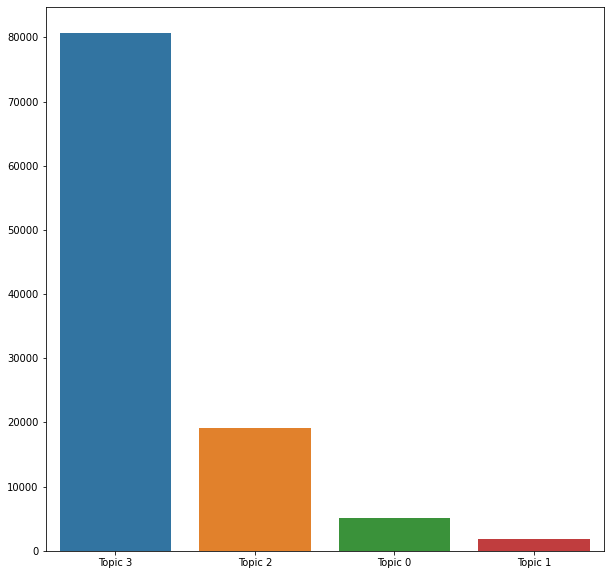

In [ ]:
D = dict(Counter(covid_data_and_topics_df['Topic']))
rcParams['figure.figsize'] = 10, 10
ax = sns.barplot(x= list(D.keys()) , y=list(D.values()))

##Word Embedding

In [ ]:
from gensim.models import Word2Vec
from gensim.test.utils import get_tmpfile
from gensim.models.callbacks import CallbackAny2Vec
class EpochLogger(CallbackAny2Vec):
     '''Callback to log information about training'''

     def __init__(self):
         self.epoch = 0
     def on_epoch_begin(self, model):
         print("Epoch #{} start".format(self.epoch))
     def on_epoch_end(self, model):
        #  print("Epoch #{} end".format(self.epoch))
         self.epoch += 1
# epoch_logger = EpochLogger()
model_path = '/content/drive/My Drive/big_data/models/word2vec/half_all_17M_TRAINABLE/model_w2v.wv'
model_w2v = Word2Vec.load(model_path)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:254: UserWarning:

This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function

/usr/local/lib/python3.6/dist-packages/gensim/utils.py:488: DeprecationWarning:

Call to deprecated `cum_table` (Attribute will be removed in 4.0.0, use self.vocabulary.cum_table instead).



In [ ]:
model_w2v.wv.most_similar(positive= "trump", topn=15)

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



[('potu', 0.7984048128128052),
 ('djt', 0.7914616465568542),
 ('donald', 0.7906200885772705),
 ('trum', 0.7872154116630554),
 ('presid', 0.7775747179985046),
 ('biden', 0.7390149831771851),
 ('obama', 0.7319172024726868),
 ('gop', 0.7193533182144165),
 ('democrat', 0.6970295906066895),
 ('republican', 0.6879650354385376),
 ('trump�', 0.6667642593383789),
 ('drumpf', 0.6530627012252808),
 ('impeach', 0.6520965099334717),
 ('hillari', 0.6509194374084473),
 ('dem', 0.6424437761306763)]

In [ ]:
# Get similar words:
model_w2v.wv.most_similar(positive= "corona", topn=15)

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



[('viru', 0.7477726340293884),
 ('rona', 0.7049121856689453),
 ('covid', 0.6752455830574036),
 ('coronaviru', 0.6661732196807861),
 ('carona', 0.5941564440727234),
 ('corna', 0.5442444086074829),
 ('corana', 0.5409408211708069),
 ('zika', 0.5347962975502014),
 ('wuhan', 0.5309022665023804),
 ('dengu', 0.5227646827697754),
 ('flu', 0.5215476751327515),
 ('viru�', 0.521190345287323),
 ('vir�', 0.5166354179382324),
 ('ebola', 0.5009503364562988),
 ('caronaviru', 0.49461495876312256)]

###tweet2vec

In [ ]:
df_filter_uncommon_topics = covid_data_and_topics_df[(covid_data_and_topics_df['Topic'] != 'Topic 0') ]
df_filter_uncommon_topics = df_filter_uncommon_topics.reset_index()

In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the token is not in vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

tokens = df_filter_uncommon_topics['tokens_w']
# Convert tweet to vector:
wordvec_arrays = np.zeros((len(tokens), 300)) 
for i in range(len(tokens)):
    wordvec_arrays[i,:] = word_vector(tokens[i], 300)
wordvec_df = pd.DataFrame(wordvec_arrays)

##Visualization tweets using PCA

In [ ]:
# Visualization tweets using PCA:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(wordvec_arrays)
df_filter_uncommon_topics['pca-one'] = pca_result[:,0]
df_filter_uncommon_topics['pca-two'] = pca_result[:,1] 
fig = px.scatter(df_filter_uncommon_topics, x="pca-one", y="pca-two", color="Topic")
fig.show()

# Analysis of Randomly Sampled Tweets

In [ ]:
# Load data:
input_url = "drive/My Drive/Colab Notebooks/Big Data/final_project/Data/BGU DATA/Random Tweets"
# random_tweets_df = load_data(input_url=input_url)
random_tweets_df = pd.read_csv("drive/My Drive/Colab Notebooks/Big Data/final_project/Data/BGU DATA/Random Tweets/2020_r_02-06_1.csv",low_memory=False)
covid_spread_state_gb = pd.read_csv("drive/My Drive/Colab Notebooks/Big Data/final_project/Output/covid_spread_state_gb.csv")

In [ ]:
# Data preprocessing:
cols = ['created_at','id','text','in_reply_to_status_id','in_reply_to_user_id','user.id','State_abbv']
random_tweets_df = preprocessing(random_tweets_df, specific_columns = cols)

Start Preprocessing
Parse Date
Remove duplicates
After pre-proccessing DF shape is 750000


In [ ]:
# Tag corona tweets:
random_tweets_df['covid_tweet'] = random_tweets_df['text'].progress_apply(lambda x: is_relevent_tweet(text=x,words_list=corona_keyword))

100%|██████████| 750000/750000 [00:18<00:00, 40640.22it/s]


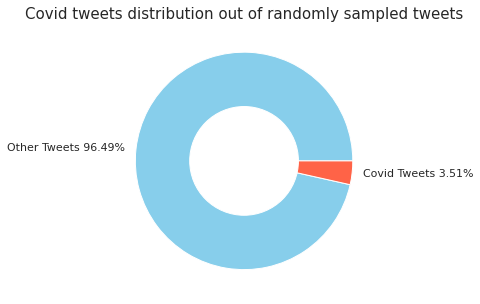

In [ ]:
# Create pie chart:
create_pie_chart(df=random_tweets_df, group_by_col='covid_tweet', count_col='id', title='Covid tweets distribution out of randomly sampled tweets')

In [ ]:
# Clean text:
min_text_len = 1
min_word_len = 3
random_tweets_df['clean_text'] = random_tweets_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x,
                                                               min_text_len=min_text_len,
                                                               min_word_len=min_word_len,
                                                               keywords_list=corona_keyword,
                                                               keywords_replacement_word='covid',
                                                               remove_hashtag=False))
random_tweets_df = random_tweets_df[~random_tweets_df['clean_text'].isna()]

100%|██████████| 750000/750000 [07:20<00:00, 1704.28it/s]


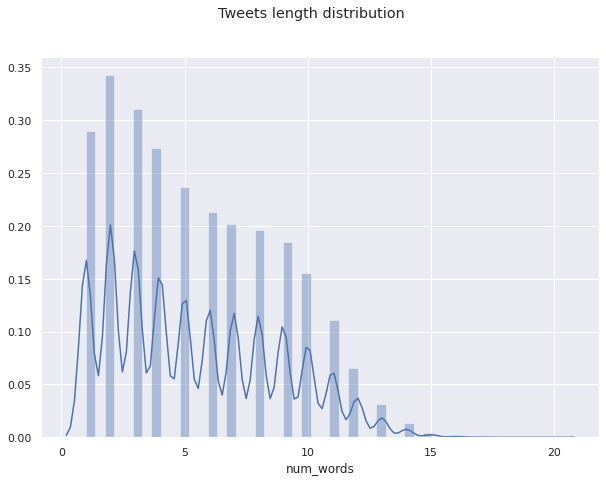

In [ ]:
# Tweet length:
random_tweets_df['num_words'] = random_tweets_df['clean_text'].apply(lambda x: len(x.split()))
plot_histogram(df=random_tweets_df, column='num_words', title='Tweets length distribution')

In [ ]:
# Create doc per day:
random_daily_tweets_gb = random_tweets_df.groupby(by='date')['clean_text'].apply(np.array).reset_index()
random_daily_tweets_gb['daily_tweets'] = random_daily_tweets_gb['clean_text'].apply(lambda x: " ".join(x))
random_daily_tweets_gb['tokens'] = random_daily_tweets_gb['daily_tweets'].apply(lambda x: x.split())

In [ ]:
# Create bigrams:
min_count=5
threshold=100
random_daily_tokens = random_daily_tweets_gb['tokens']
random_daily_tweets = random_daily_tweets_gb['daily_tweets']
random_bigram = gensim.models.Phrases(random_daily_tokens, min_count=min_count, threshold=threshold)
random_bigram_mod = gensim.models.phrases.Phraser(random_bigram)
random_daily_unigram_and_bigram = [random_bigram_mod[daily_tweets_tokens] for daily_tweets_tokens in tqdm(random_daily_tokens)]

100%|██████████| 15/15 [00:11<00:00,  1.30it/s]


In [ ]:
# Create Dictionary:
random_id2word = corpora.Dictionary(random_daily_unigram_and_bigram)

# Term Document Frequency:
random_corpus = [random_id2word.doc2bow(tweet) for tweet in random_daily_unigram_and_bigram]

In [ ]:
# Train LDA model and use grid search to find the best num of topics:
start=20
limit=40
step=5
chunksize = 5000
random_state=11
update_every=1
passes=10
alpha='auto'
per_word_topics=True

model_list, coherence_values = compute_coherence_values(dictionary=random_id2word,
                                                        corpus=random_corpus,
                                                        texts=random_daily_unigram_and_bigram,
                                                        start=start,
                                                        limit=limit,
                                                        step=step,
                                                        random_state=random_state,
                                                        update_every=update_every,
                                                        passes=passes,
                                                        alpha=alpha,
                                                        per_word_topics=per_word_topics,
                                                        chunksize=chunksize)

100%|██████████| 4/4 [13:22<00:00, 200.67s/it]


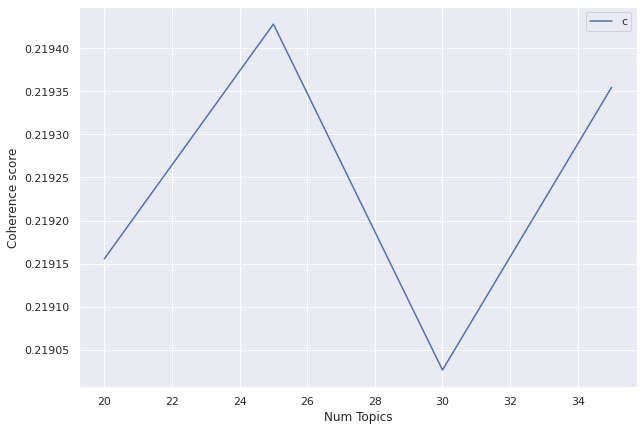

In [ ]:
# Plot the coherence values:
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [ ]:
# Get best model:
model_selected = np.argmax(coherence_values)
best_model = model_list[model_selected]
model_topics = best_model.show_topics(formatted=False)

In [ ]:
# Model evaluation:
print('\nPerplexity: ', best_model.log_perplexity(random_corpus))
coherence_model_lda = CoherenceModel(model=best_model, texts=random_daily_unigram_and_bigram, dictionary=random_id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)


Perplexity:  -8.30565948358304
Coherence Score:  0.2194278369734239


In [ ]:
# Extract topic per day:
random_daily_tweets_topics_df, cols = get_topics_per_doc(ldamodel=best_model, corpus=random_corpus)
random_daily_tweets_and_topic_df = concat_dfs_by_col(list_of_dfs=[random_daily_tweets_gb, random_daily_tweets_topics_df])

100%|██████████| 15/15 [00:00<00:00, 260.10it/s]


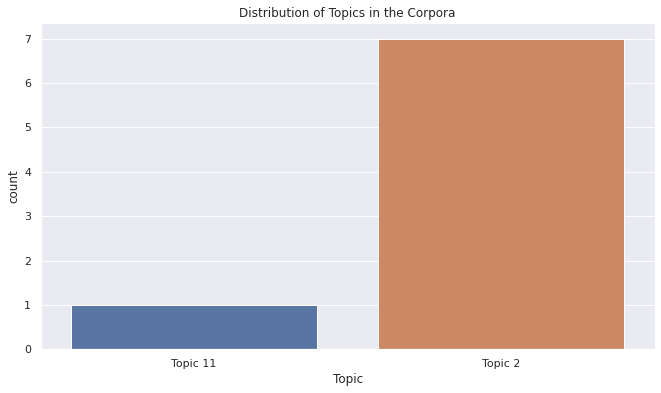

In [ ]:
# Distribution of Topics in the Corpora:
random_daily_tweets_topics_gb = random_daily_tweets_and_topic_df.groupby(by='Topic')[list(random_daily_tweets_and_topic_df.columns)[0]].count().reset_index()
random_daily_tweets_topics_gb = random_daily_tweets_topics_gb.rename(columns={'date': "count"})
plt.figure(figsize=(11,6))
ax = sns.barplot(x="Topic",y='count', data=random_daily_tweets_topics_gb).set_title('Distribution of Topics in the Corpora')

In [ ]:
# Visualize the topics:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(best_model, random_corpus, random_id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.251260 -0.001735       1        1  86.503723
11     0.263712 -0.009347       2        1  10.369034
23     0.234969  0.051894       3        1   2.496632
21     0.174923 -0.056869       4        1   0.625970
19     0.069479  0.010412       5        1   0.004524
9      0.004744  0.002180       6        1   0.000007
8     -0.015886  0.001625       7        1   0.000006
3     -0.015691  0.000828       8        1   0.000006
13    -0.081606 -0.000026       9        1   0.000006
0     -0.080054 -0.000109      10        1   0.000006
4     -0.074163 -0.000329      11        1   0.000006
14    -0.068063  0.000009      12        1   0.000006
10    -0.068197  0.001098      13        1   0.000006
5     -0.064698  0.000440      14        1   0.000006
20    -0.061531 -0.000608      15        1   0.000006
12    -0.057124 -0.000494      16        1   0.000006
15    -0.055921 -0.000127      17        1   0.000006
16    -0.055706 -0.000095      18        1   0.000006
24    -0.052798  0.000647      19        1   0.000006
17    -0.049793 -0.001118      20        1   0.000006
18    -0.047122  0.000741      21        1   0.000006
1     -0.039734 -0.000465      22        1   0.000006
6     -0.038775  0.000917      23        1   0.000006
7     -0.037414  0.000137      24        1   0.000005
22    -0.034813  0.000394      25        1   0.000005, topic_info=         Term          Freq         Total Category  logprob  loglift
13420    like  25118.000000  25118.000000  Default  30.0000  30.0000
9175      get  20356.000000  20356.000000  Default  29.0000  29.0000
16659     one  16239.000000  16239.000000  Default  28.0000  28.0000
5079    covid  15363.000000  15363.000000  Default  27.0000  27.0000
13793    love  14069.000000  14069.000000  Default  26.0000  26.0000
...       ...           ...           ...      ...      ...      ...
24236     tri      0.000077   5796.644531  Topic25  -7.4125  -1.4180
15942     new      0.000076   5920.288574  Topic25  -7.4284  -1.4550
14139     man      0.000075   6193.031250  Topic25  -7.4346  -1.5062
19059  realli      0.000086   8930.658203  Topic25  -7.3075  -1.7452
21059    shit      0.000077   6838.883301  Topic25  -7.4164  -1.5872

[1744 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
193        1  0.975998      acosta
229        1  0.976064  ada_counti
27245      1  0.262159  adult_swim
27245      2  0.711574  adult_swim
41740      1  0.255913  aewdynamit
...      ...       ...         ...
26655      2  0.100776        year
26655      3  0.024482        year
26655      4  0.006405        year
78805      2  1.053719    모아에게_받아요
87012      4  0.868309    𝘗𝘳𝘦𝘴𝘴𝘶𝘳𝘦

[645 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 12, 24, 22, 20, 10, 9, 4, 14, 1, 5, 15, 11, 6, 21, 13, 16, 17, 25, 18, 19, 2, 7, 8, 23])

In [ ]:
# Trend of topics over time:
daily_topic_dist_df = random_daily_tweets_and_topic_df.groupby(by='date').mean()[cols].reset_index()
daily_topic_dist_df["date"] = daily_topic_dist_df["date"].astype(str)
daily_topic_dist_df = daily_topic_dist_df.merge(covid_spread_state_gb, on='date', how='left')
daily_topic_dist_df['covid cases'] = daily_topic_dist_df['covid cases'].fillna(value=0)

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig = go.Figure([{
    'x': daily_topic_dist_df['date'],
    'y': daily_topic_dist_df[topic],
    'name': topic
}  for topic in cols])

fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(daily_topic_dist_df['covid cases'],11,3), name="Covid Cases", line=dict(color='red', width=2)),
)

fig.update_layout(
    title="Trend of topics over time")

iplot(fig)

In [ ]:
# TODO: fix graph dates problem

#TEST

In [ ]:

!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=12UYtOxAab4yBwH2QyQU3JYb75mIgXuM2' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=12UYtOxAab4yBwH2QyQU3JYb75mIgXuM2" -O 'wv.pickle.zip' && rm -rf /tmp/cookies.txt



--2020-08-31 22:55:38--  https://docs.google.com/uc?export=download&confirm=Gjkt&id=12UYtOxAab4yBwH2QyQU3JYb75mIgXuM2
Resolving docs.google.com (docs.google.com)... 108.177.12.100, 108.177.12.138, 108.177.12.113, ...
Connecting to docs.google.com (docs.google.com)|108.177.12.100|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-00-40-docs.googleusercontent.com/docs/securesc/h4682gnb6caabnuoao3j8272t2u3l01r/mcpp9rotnkmba3joml4ulm4b5em3k2rk/1598914500000/10011522191278001646/05334393375792601317Z/12UYtOxAab4yBwH2QyQU3JYb75mIgXuM2?e=download [following]
--2020-08-31 22:55:38--  https://doc-00-40-docs.googleusercontent.com/docs/securesc/h4682gnb6caabnuoao3j8272t2u3l01r/mcpp9rotnkmba3joml4ulm4b5em3k2rk/1598914500000/10011522191278001646/05334393375792601317Z/12UYtOxAab4yBwH2QyQU3JYb75mIgXuM2?e=download
Resolving doc-00-40-docs.googleusercontent.com (doc-00-40-docs.googleusercontent.com)... 173.194.213.132, 2607:f8b0:400c:c0a::84
Connectin

In [ ]:
!unzip wv.pickle.zip

Archive:  wv.pickle.zip
  inflating: model_w2v_30_epochs.obj  


In [ ]:
import pickle 
 


with open('model_w2v_30_epochs.obj', 'rb') as f:
    wv_model = pickle.load(f)

In [ ]:
wv_model.wv.most_similar(positive= "heineken", topn=15)

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



[('beer', 0.5315553545951843),
 ('budweis', 0.5149227976799011),
 ('drink', 0.5013728737831116),
 ('lager', 0.4894668161869049),
 ('crownroy', 0.4691486656665802),
 ('coke', 0.4678104817867279),
 ('soda', 0.4610060453414917),
 ('competitiontim', 0.4576464295387268),
 ('cola', 0.4556387662887573),
 ('coca', 0.44950950145721436),
 ('whiski', 0.44543537497520447),
 ('drinker', 0.44482314586639404),
 ('henni', 0.4423559308052063),
 ('millerhighlif', 0.440151184797287),
 ('seltzer', 0.43893808126449585)]

In [ ]:
wv_model.corpus_count

27944847

In [ ]:
x.num_topics

# # Show topics:
# for index, topic in x.show_topics(formatted=False, num_words= 10):
#   print('Topic: {} \nWords: {}'.format(index+1, [w[0] for w in topic]))

100